In [172]:
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import os
import tensorflow as tf
from tqdm import tqdm
import requests
import json
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_log_error

from datetime import datetime
from datetime import timedelta

from tensorflow.keras import layers
from tensorflow.keras import Input
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

import matplotlib.pyplot as plt
import seaborn as sns
sns.set()


for dirname, _, filenames in os.walk('./input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

./input/covid19countryinfo.csv
./input/states-daily.csv
./input/covid19-deepscore.csv
./input/population_data.csv
./input/full-list-total-tests-for-covid-19.csv
./input/country_codes.csv
./input/enriched_covid_19_week_2.csv
./input/covid19-global-forecasting-week-3/test.csv
./input/covid19-global-forecasting-week-3/submission.csv
./input/covid19-global-forecasting-week-3/train.csv
./input/korea/SeoulFloating.csv
./input/korea/TimeAge.csv
./input/korea/SearchTrend.csv
./input/korea/TimeProvince.csv
./input/korea/Weather.csv
./input/korea/PatientRoute.csv
./input/korea/PatientInfo.csv
./input/korea/Region.csv
./input/korea/TimeGender.csv
./input/korea/Case.csv
./input/korea/Time.csv
./input/covid19-global-forecasting-week-2/test.csv
./input/covid19-global-forecasting-week-2/submission.csv
./input/covid19-global-forecasting-week-2/train.csv
./input/covidAPI/ESP.json
./input/covidAPI/ICL.json
./input/covidAPI/CHN.json
./input/covidAPI/FRA.json
./input/covidAPI/THA.json
./input/covidAPI/DNK

# 2. Preparing the training data

In [173]:
def code_to_entity(code):
    dic = {"KOR": "South Korea", "ITA": "Italy", "FRA": "France", "DEU": "Germany", "ISL": "Iceland", "DNK": "Denmark", "THA": "Thailand", "TWN": "Taiwan"}
    return dic[code]

In [174]:
# Get API data (confirmed, deaths, recovered)
# filter by country codes
country_codes = ["KOR", "ITA", "FRA", "DEU", "ISL", "DNK", "THA", "TWN"]

for country in country_codes:
    response = requests.get('https://covidapi.info/api/v1/country/{}'.format(country))
    try:
        data = response.json()
    except:
        print("{} not found".format(country))
    with open("./input/covidAPI/{}.json".format(country), "w") as f:
        json.dump(data["result"], f, indent=4)

In [175]:
original_df = pd.read_csv("./input/full-list-total-tests-for-covid-19.csv")

# unify date format
original_df["Date"] = [datetime.strftime(datetime.strptime(date, '%b %d, %Y'), '%Y-%m-%d') for date in original_df["Date"]]
original_df = original_df.rename(columns={"Total tests": "test"})
original_df.head()

,Entity,Code,Date,test
0,Argentina,ARG,2020-04-08,13330
1,Argentina,ARG,2020-04-09,14850
2,Argentina,ARG,2020-04-10,16379
3,Argentina,ARG,2020-04-11,18027
4,Argentina,ARG,2020-04-13,19758


In [176]:
original_df = original_df.query("Code in {}".format(country_codes))
original_df.reset_index(inplace=True, drop=True)
original_df.head()

,Entity,Code,Date,test
0,Denmark,DNK,2020-03-17,7630
1,Denmark,DNK,2020-03-19,8847
2,Denmark,DNK,2020-03-20,11657
3,Denmark,DNK,2020-03-21,12351
4,Denmark,DNK,2020-03-22,12843


In [177]:
# Merge Dataframe
import json

new_df = original_df
for code in country_codes:
    with open("./input/covidAPI/{}.json".format(code), "r") as f:
        j = json.load(f)
    # for each date
    for key in j.keys():
        # for each in (confirmed, deaths, recovered)
        for k in j[key].keys():
            if ((new_df['Code'] == code) & (new_df['Date'] == key)).any():
                new_df.loc[(new_df["Code"] == code) & (new_df["Date"] == key), k] = j[key][k]
            else:
                s = pd.Series([code_to_entity(code), code, key, j[key][k]], index=["Entity", "Code", "Date", k])
                new_df = new_df.append(s,ignore_index=True)
new_df = new_df.sort_values(['Code', 'Date'])
new_df.reset_index(inplace=True, drop=True)
print(new_df.head())

    Entity Code        Date  test  confirmed  deaths  recovered
0  Germany  DEU  2020-01-22   NaN        0.0     0.0        0.0
1  Germany  DEU  2020-01-23   NaN        0.0     0.0        0.0
2  Germany  DEU  2020-01-24   NaN        0.0     0.0        0.0
3  Germany  DEU  2020-01-25   NaN        0.0     0.0        0.0
4  Germany  DEU  2020-01-26   NaN        0.0     0.0        0.0


In [178]:
# Interpolate
new_df["test"].where(new_df["confirmed"] != 0.0, 0.0, inplace=True)
# add test values to unique countries
for code in ["THA", "TWN"]:
    first_confirmed = new_df.loc[(new_df["Code"] == code) & (new_df["Date"] == "2020-01-22"), "confirmed"].values[0]
    new_df.loc[(new_df["Code"] == code) & (new_df["Date"] == "2020-01-22"), "test"] = new_df.loc[(new_df["Code"] == "KOR") & (new_df["confirmed"] == first_confirmed), "test"].values[0]

for code in country_codes:
    tmp_df = new_df[new_df["Code"] == code]
    tmp_df.interpolate(inplace=True)
    new_df[new_df["Code"]==code] = tmp_df
print(new_df.head())

/Users/Skrimson64/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


    Entity Code        Date  test  confirmed  deaths  recovered
0  Germany  DEU  2020-01-22   0.0        0.0     0.0        0.0
1  Germany  DEU  2020-01-23   0.0        0.0     0.0        0.0
2  Germany  DEU  2020-01-24   0.0        0.0     0.0        0.0
3  Germany  DEU  2020-01-25   0.0        0.0     0.0        0.0
4  Germany  DEU  2020-01-26   0.0        0.0     0.0        0.0


In [179]:
# Add rates
# new_df["infectious_rate"] = (new_df["test"] - new_df["negative"]) / new_df["test"]
new_df["infectious_rate"] = new_df["confirmed"] / new_df["test"]
new_df["removed_rate"] = (new_df["deaths"] + new_df["recovered"]) / new_df["test"]
new_df["susceptible_rate"] = 1.0 - (new_df["infectious_rate"] + new_df["removed_rate"])
new_df["infectious_rate_change"] = 0.0
new_df["removed_rate_change"] = 0.0
new_df["susceptible_rate_change"] = 0.0

# Drop nulls
new_df.dropna(how='any', inplace=True)
print(new_df.head())

    Entity Code        Date          test  confirmed  deaths  recovered  \
5  Germany  DEU  2020-01-27   2969.428571        1.0     0.0        0.0   
6  Germany  DEU  2020-01-28   5938.857143        4.0     0.0        0.0   
7  Germany  DEU  2020-01-29   8908.285714        4.0     0.0        0.0   
8  Germany  DEU  2020-01-30  11877.714286        4.0     0.0        0.0   
9  Germany  DEU  2020-01-31  14847.142857        5.0     0.0        0.0   

   infectious_rate  removed_rate  susceptible_rate  infectious_rate_change  \
5         0.000337           0.0          0.999663                     0.0   
6         0.000674           0.0          0.999326                     0.0   
7         0.000449           0.0          0.999551                     0.0   
8         0.000337           0.0          0.999663                     0.0   
9         0.000337           0.0          0.999663                     0.0   

   removed_rate_change  susceptible_rate_change  
5                  0.0        

In [180]:
# Smoothing
def mu_sigma_justify(Y, floor_n=1, ceil_n=1.5, mu=None, sigma=None):
    """μとσを用いた補正関数。
    Args:
        floor_n (float):
        ceil_n (float):
        mu (Optional[float]):
        sigma (Optional[float]):
    """
    mu = mu or Y.mean()
    sigma = sigma or Y.std()
    Y = Y.copy()
    Y_ = Y.copy()
    Y[abs(Y_ - mu) < floor_n * sigma] = mu  # μ±σ ⇒ μ
    Y[Y_ > mu + ceil_n * sigma] = mu + ceil_n * sigma  # μ＋3σ より大きい ⇒ μ＋3σ
    Y[Y_ < mu - ceil_n * sigma] = mu - ceil_n * sigma  # μー3σ より小さい ⇒ μー3σ
    return Y

In [181]:
def compare_smoothing(df):
    plt.plot(tmp_df["infectious_rate"].values)
    plt.plot(mu_sigma_justify(tmp_df["infectious_rate"].values))
    plt.title("Infectious Rate Smoothing Comparison")
    plt.ylabel('Infectious Rate')
    plt.xlabel('Date')
    plt.xticks(range(len(df["Date"].values)),df["Date"].values,rotation='vertical')
    plt.legend(['Before', 'After'], loc='best')
    plt.show()
    
    plt.plot(tmp_df["removed_rate"].values)
    plt.plot(mu_sigma_justify(tmp_df["removed_rate"].values))
    plt.title("Removed Rate Smoothing Comparison")
    plt.ylabel('Removed Rate')
    plt.xlabel('Date')
    plt.xticks(range(len(df["Date"].values)),df["Date"].values,rotation='vertical')
    plt.legend(['Before', 'After'], loc='best')
    plt.show()

def display_rate(tmp_df):
    plt.plot(tmp_df["infectious_rate"].values)
    plt.plot(tmp_df["removed_rate"].values)
    plt.plot(tmp_df["susceptible_rate"].values)
    plt.title("Rate")
    plt.ylabel('Rate')
    plt.xlabel('Date')
    plt.xticks(range(len(tmp_df.Date.values)),tmp_df.Date.values,rotation='vertical')
    plt.legend(['Infectious Rate', 'Removed Rate', 'Susceptible Rate'], loc='best')
    plt.show()

In [182]:
# Calculate Change Rate
for code in country_codes:
    print("-----------------{}------------------".format(code))

    # normalize
    # compare_smoothing(tmp_df)
    # tmp_df["infectious_rate"] = mu_sigma_justify(tmp_df["infectious_rate"].values)
    # tmp_df["removed_rate"] = mu_sigma_justify(tmp_df["removed_rate"].values)
    # tmp_df["susceptible_rate"] = mu_sigma_justify(tmp_df["susceptible_rate"].values)

    tmp_df = new_df[new_df["Code"] == code]
    tmp_df["infectious_rate_change"] = tmp_df["infectious_rate"].pct_change()
    tmp_df["infectious_rate_change"] = tmp_df["infectious_rate_change"].replace([np.inf, -np.inf], np.nan).fillna(0.0)
    tmp_df["removed_rate_change"] = tmp_df["removed_rate"].pct_change()
    tmp_df["removed_rate_change"] = tmp_df["removed_rate_change"].replace([np.inf, -np.inf], np.nan).fillna(0.0)
    tmp_df["susceptible_rate_change"] = tmp_df["susceptible_rate_change"].pct_change()
    tmp_df["susceptible_rate_change"] = tmp_df["susceptible_rate_change"].replace([np.inf, -np.inf], np.nan).fillna(0.0)

    new_df[new_df["Code"]==code] = tmp_df
    
# Save
new_df.to_csv("./input/covid19-deepscore.csv")

-----------------KOR------------------


/Users/Skrimson64/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
/Users/Skrimson64/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  del sys.path[0]
/Users/Skrimson64/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

-----------------ITA------------------
-----------------FRA------------------
-----------------DEU------------------
-----------------ISL------------------
-----------------DNK------------------
-----------------THA------------------
-----------------TWN------------------


In [183]:
# The SIR model differential equations.
def deriv(y, t, N, beta, gamma):
    S, I, R = y
    dSdt = -beta * S * I
    dIdt = beta * S * I - gamma * I
    dRdt = gamma * I
    return dSdt, dIdt, dRdt

def gamma(x):
    return x * x * 1/50000

['2020-02-01', '2020-02-02', '2020-02-03', '2020-02-04', '2020-02-05', '2020-02-06', '2020-02-07', '2020-02-08', '2020-02-09', '2020-02-10', '2020-02-11', '2020-02-12', '2020-02-13', '2020-02-14', '2020-02-15', '2020-02-16', '2020-02-17', '2020-02-18', '2020-02-19', '2020-02-20', '2020-02-21', '2020-02-22', '2020-02-23', '2020-02-24', '2020-02-25', '2020-02-26', '2020-02-27', '2020-02-28', '2020-02-29', '2020-03-01', '2020-03-02', '2020-03-03', '2020-03-04', '2020-03-05', '2020-03-06', '2020-03-07', '2020-03-08', '2020-03-09', '2020-03-10', '2020-03-11', '2020-03-12', '2020-03-13', '2020-03-14', '2020-03-15', '2020-03-16', '2020-03-17', '2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21', '2020-03-22', '2020-03-23', '2020-03-24', '2020-03-25', '2020-03-26', '2020-03-27', '2020-03-28', '2020-03-29', '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02', '2020-04-03', '2020-04-04', '2020-04-05', '2020-04-06', '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10', '2020-04-11', '2020

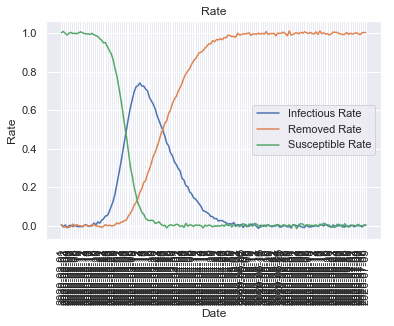

--------------------------------------------------------
first beta=2.9914523342257044e-06, first gamma=0.0
last beta=1.5327311865526151e-07, last gamma=0.50562


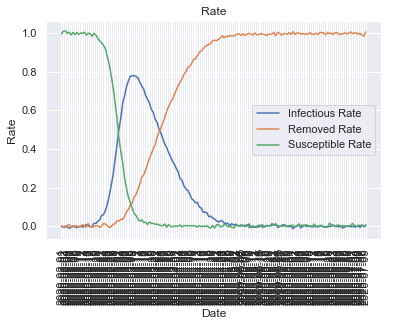

--------------------------------------------------------
first beta=2.437877700805582e-06, first gamma=0.0
last beta=9.91415700416222e-08, last gamma=0.50562


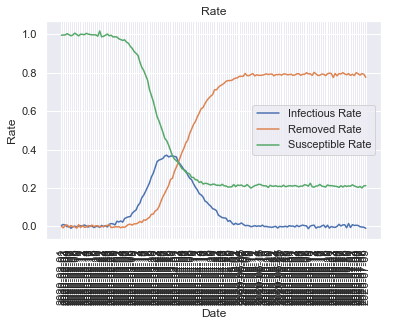

--------------------------------------------------------
first beta=2.304962620450945e-06, first gamma=0.0
last beta=1.1266827419941411e-07, last gamma=0.50562


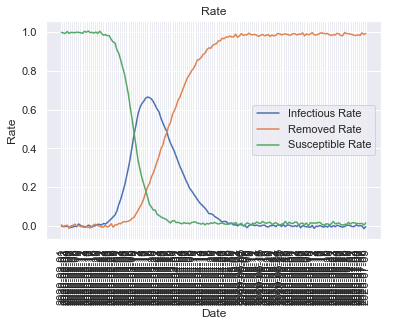

--------------------------------------------------------
first beta=3.3214947075355606e-06, first gamma=0.0
last beta=1.863195057798307e-07, last gamma=0.50562


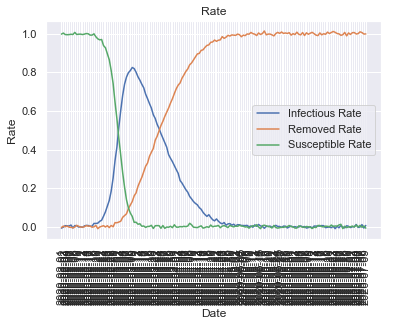

--------------------------------------------------------
first beta=3.0647784525776282e-06, first gamma=0.0
last beta=3.4246668644035757e-07, last gamma=0.50562


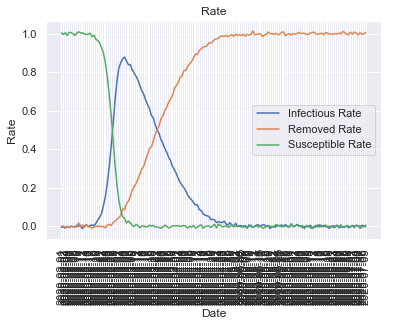

--------------------------------------------------------
first beta=3.0014826639288884e-06, first gamma=0.0
last beta=1.0674380634824716e-07, last gamma=0.50562


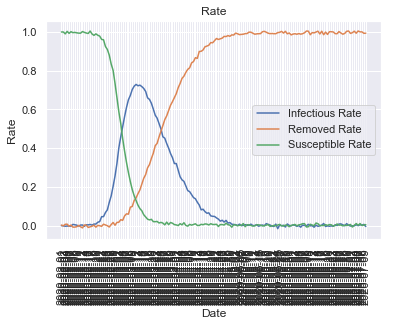

--------------------------------------------------------
first beta=2.990050320152394e-06, first gamma=0.0
last beta=1.1862521988559468e-07, last gamma=0.50562


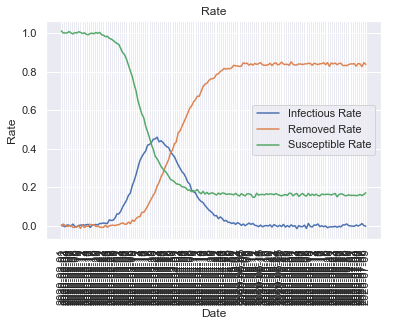

--------------------------------------------------------
first beta=2.6604214300121244e-06, first gamma=0.0
last beta=5.149461764849933e-08, last gamma=0.50562


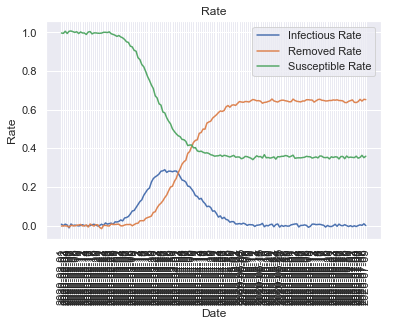

--------------------------------------------------------
first beta=2.3685802190505403e-06, first gamma=0.0
last beta=7.897403333459279e-08, last gamma=0.50562


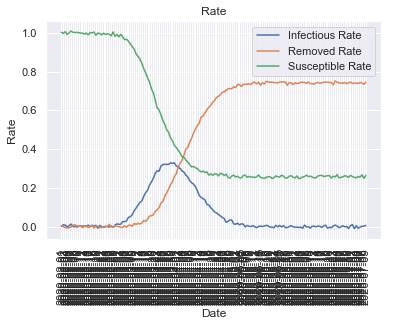

--------------------------------------------------------
first beta=3.3790640231428208e-06, first gamma=0.0
last beta=8.729677514566801e-08, last gamma=0.50562


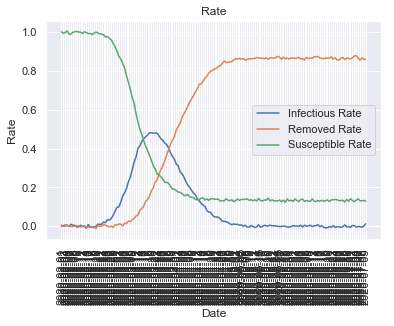

--------------------------------------------------------
first beta=2.3589677954923916e-06, first gamma=0.0
last beta=1.0678353972198569e-07, last gamma=0.50562


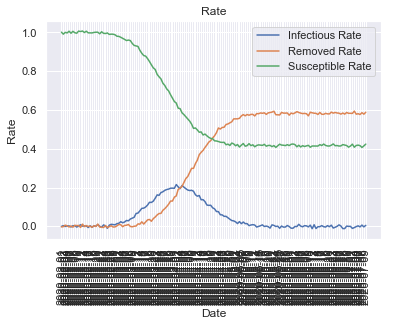

--------------------------------------------------------
first beta=2.7156567277451505e-06, first gamma=0.0
last beta=1.0839578922519622e-07, last gamma=0.50562


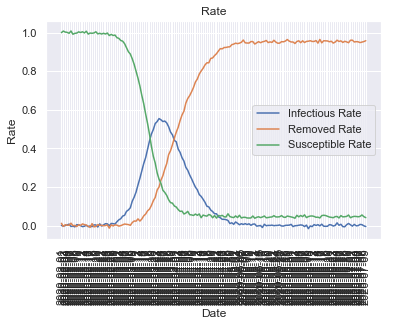

--------------------------------------------------------
first beta=3.0662563995401268e-06, first gamma=0.0
last beta=1.573574283948509e-07, last gamma=0.50562


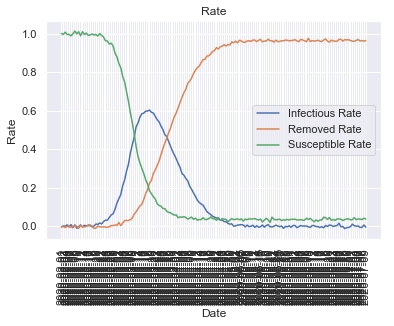

--------------------------------------------------------
first beta=3.348278219600263e-06, first gamma=0.0
last beta=1.73206425711854e-07, last gamma=0.50562


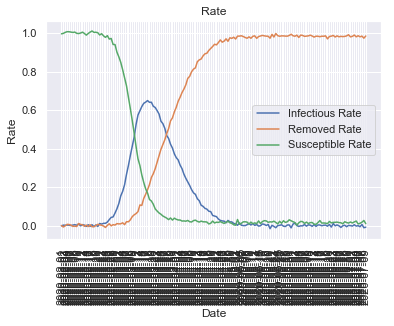

--------------------------------------------------------
first beta=3.4922598190509546e-06, first gamma=0.0
last beta=5.109808161269368e-07, last gamma=0.50562


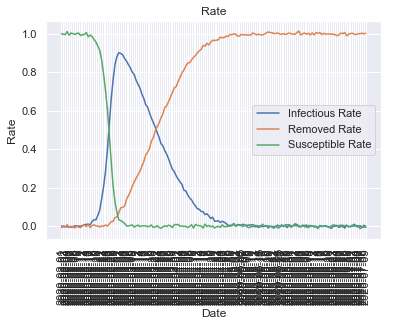

--------------------------------------------------------
first beta=2.851614835163829e-06, first gamma=0.0
last beta=2.0257588716411122e-07, last gamma=0.50562


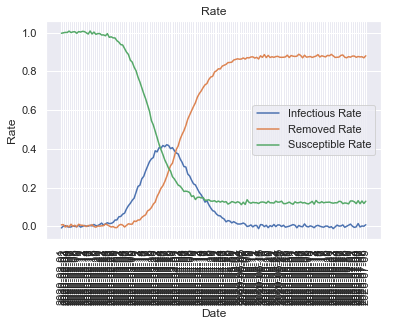

--------------------------------------------------------
first beta=2.5854981878694174e-06, first gamma=0.0
last beta=2.0627980354227226e-07, last gamma=0.50562


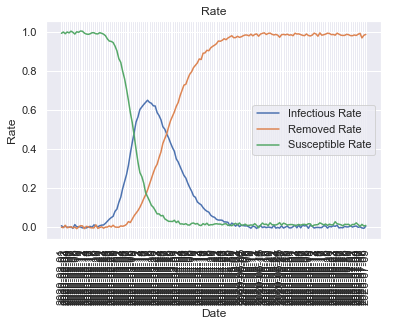

--------------------------------------------------------
first beta=3.160163943990179e-06, first gamma=0.0
last beta=3.059723277157418e-07, last gamma=0.50562


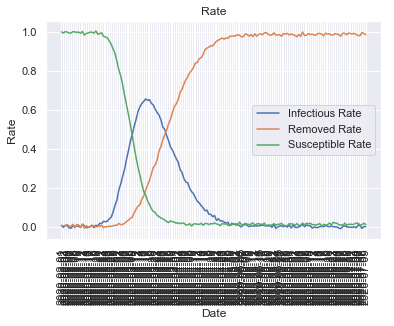

--------------------------------------------------------
first beta=2.365319533013032e-06, first gamma=0.0
last beta=1.4971800746898522e-07, last gamma=0.50562


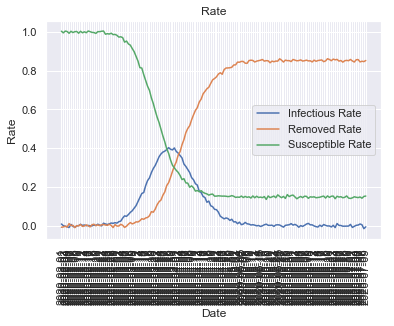

--------------------------------------------------------
first beta=2.58313869855871e-06, first gamma=0.0
last beta=1.6407012785076203e-07, last gamma=0.50562


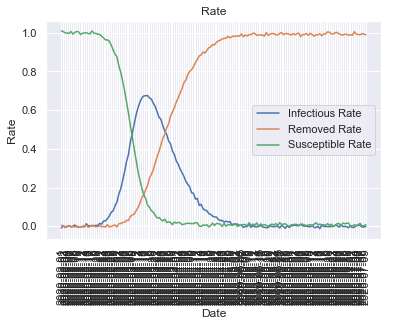

--------------------------------------------------------
first beta=2.302986628563609e-06, first gamma=0.0
last beta=9.699846875831466e-08, last gamma=0.50562


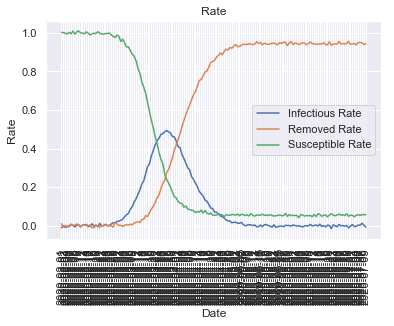

--------------------------------------------------------
first beta=2.416405598238244e-06, first gamma=0.0
last beta=6.781715937022542e-08, last gamma=0.50562


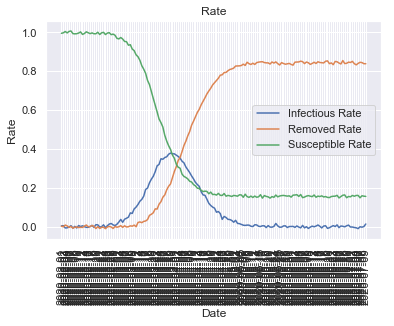

--------------------------------------------------------
first beta=2.4277438968551535e-06, first gamma=0.0
last beta=1.010293721922946e-07, last gamma=0.50562


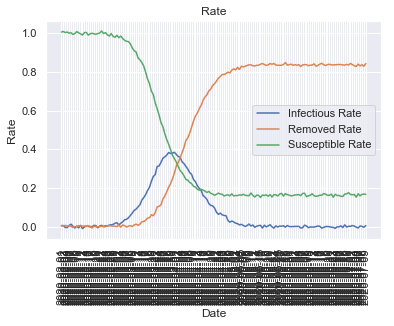

--------------------------------------------------------
first beta=2.7151040395708706e-06, first gamma=0.0
last beta=1.5435449947500617e-07, last gamma=0.50562


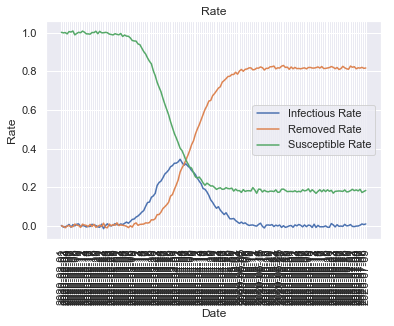

--------------------------------------------------------
first beta=2.610205095281707e-06, first gamma=0.0
last beta=7.824843040897683e-08, last gamma=0.50562


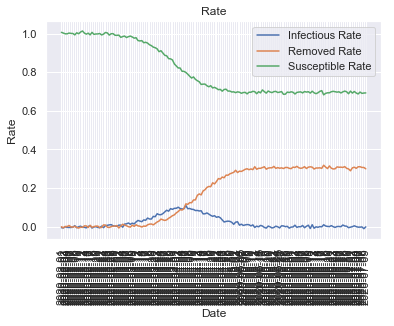

--------------------------------------------------------
first beta=2.5016384282911857e-06, first gamma=0.0
last beta=2.2750715153685114e-07, last gamma=0.50562


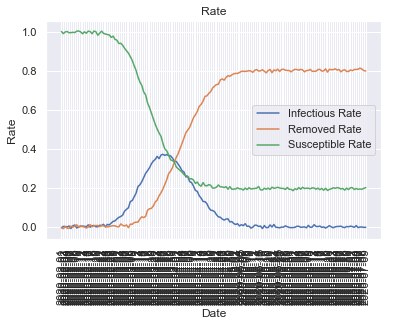

--------------------------------------------------------
first beta=2.888337384527987e-06, first gamma=0.0
last beta=2.1253727704541438e-07, last gamma=0.50562


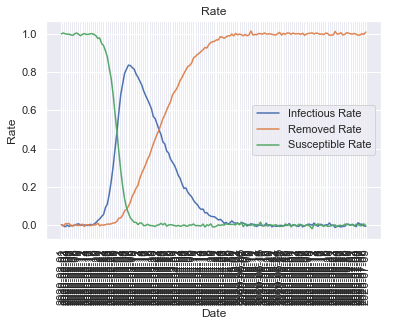

--------------------------------------------------------
first beta=2.4014742591285035e-06, first gamma=0.0
last beta=1.3642981718582916e-07, last gamma=0.50562


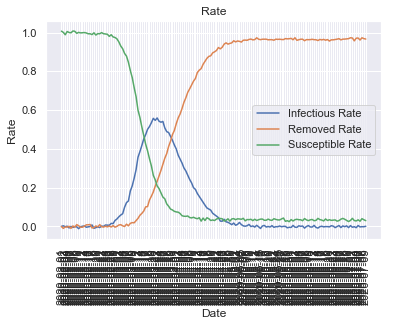

--------------------------------------------------------
first beta=2.84901792308541e-06, first gamma=0.0
last beta=1.3275446191267864e-07, last gamma=0.50562


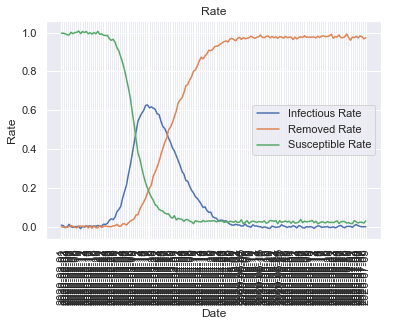

--------------------------------------------------------
first beta=3.232779332849158e-06, first gamma=0.0
last beta=1.2329886297256278e-07, last gamma=0.50562


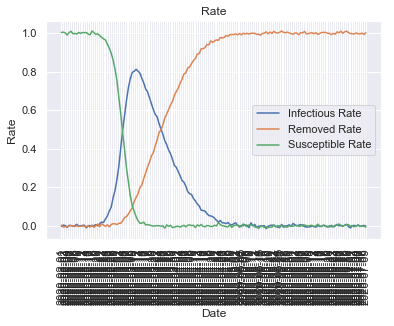

--------------------------------------------------------
first beta=2.4862520785142026e-06, first gamma=0.0
last beta=8.598077931779301e-08, last gamma=0.50562


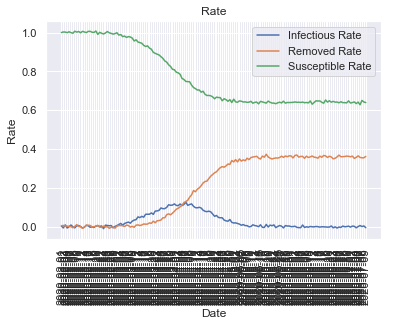

--------------------------------------------------------
first beta=2.54823704559323e-06, first gamma=0.0
last beta=1.895194399420639e-07, last gamma=0.50562


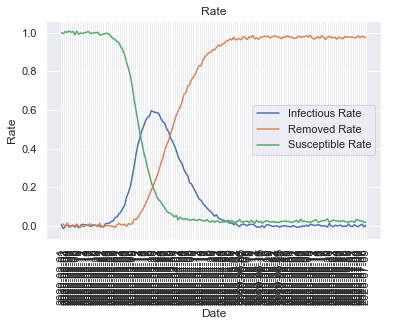

--------------------------------------------------------
first beta=3.022381368922293e-06, first gamma=0.0
last beta=8.450243350787334e-08, last gamma=0.50562


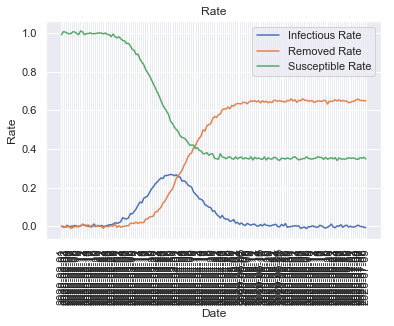

--------------------------------------------------------
first beta=2.8577660968947906e-06, first gamma=0.0
last beta=1.1202042619688401e-07, last gamma=0.50562


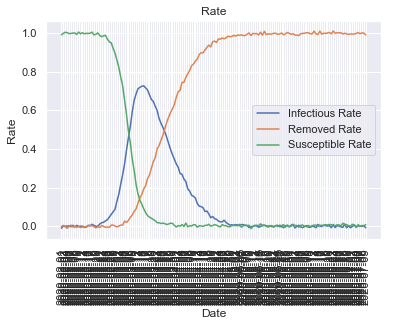

--------------------------------------------------------
first beta=2.4613885185775087e-06, first gamma=0.0
last beta=2.275937181329957e-07, last gamma=0.50562


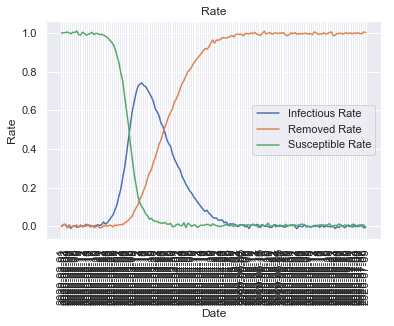

--------------------------------------------------------
first beta=2.6601383922035984e-06, first gamma=0.0
last beta=1.0549279282369183e-07, last gamma=0.50562


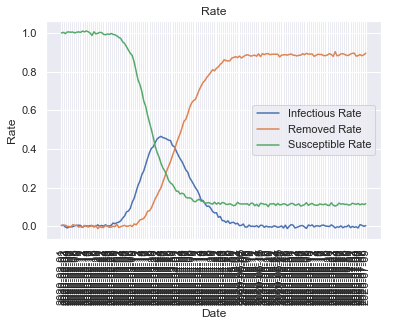

--------------------------------------------------------
first beta=2.701924942995731e-06, first gamma=0.0
last beta=7.104672178959277e-08, last gamma=0.50562


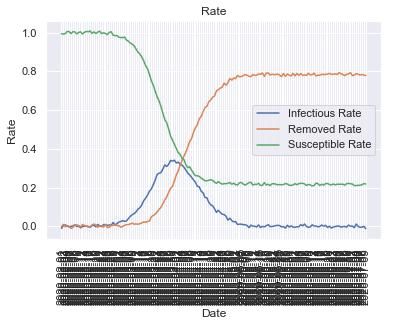

--------------------------------------------------------
first beta=3.2316337505309532e-06, first gamma=0.0
last beta=2.1268505371853356e-07, last gamma=0.50562


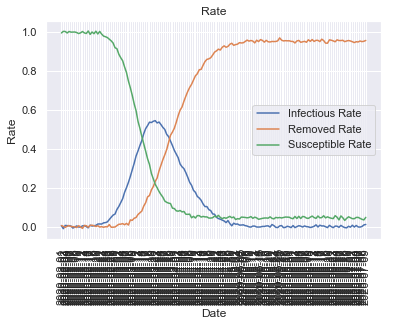

--------------------------------------------------------
first beta=2.3543765873881454e-06, first gamma=0.0
last beta=1.013408819991e-07, last gamma=0.50562


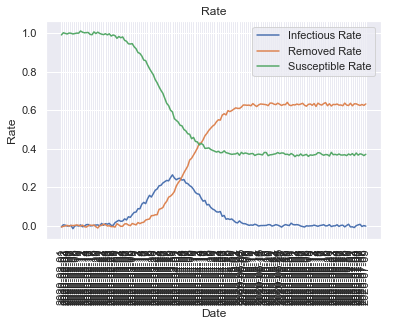

--------------------------------------------------------
first beta=2.8590556369105734e-06, first gamma=0.0
last beta=1.0978584602778203e-07, last gamma=0.50562


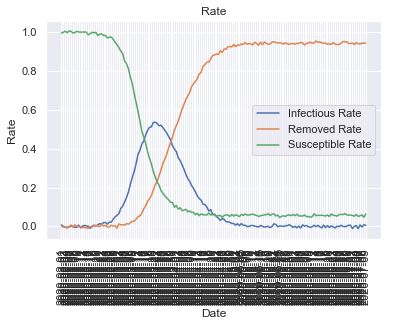

--------------------------------------------------------
first beta=2.958472947041156e-06, first gamma=0.0
last beta=2.1826159607004718e-07, last gamma=0.50562


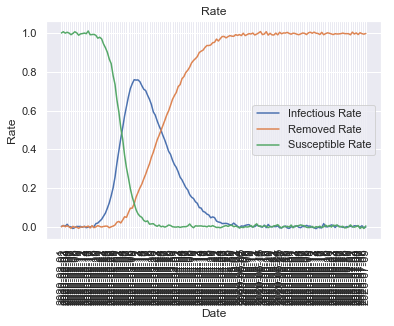

--------------------------------------------------------
first beta=2.581364595052461e-06, first gamma=0.0
last beta=2.0690939259440046e-07, last gamma=0.50562


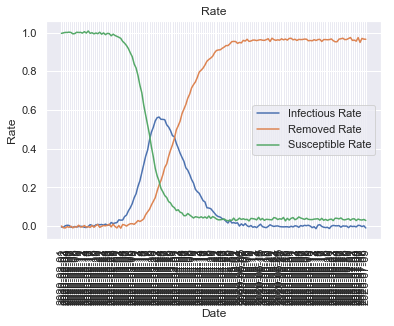

--------------------------------------------------------
first beta=2.737891204290274e-06, first gamma=0.0
last beta=5.2796659843588197e-08, last gamma=0.50562


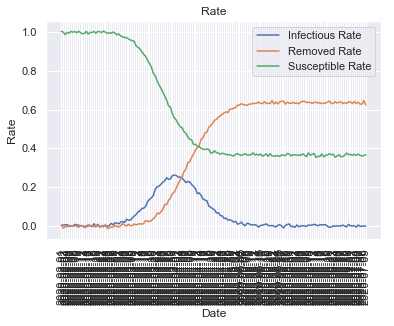

--------------------------------------------------------
first beta=2.848504168832685e-06, first gamma=0.0
last beta=9.945760169735355e-08, last gamma=0.50562


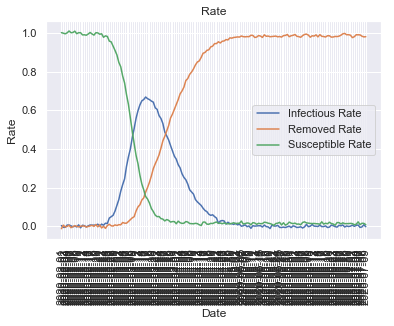

--------------------------------------------------------
first beta=2.470819398222868e-06, first gamma=0.0
last beta=1.3463166947977905e-07, last gamma=0.50562


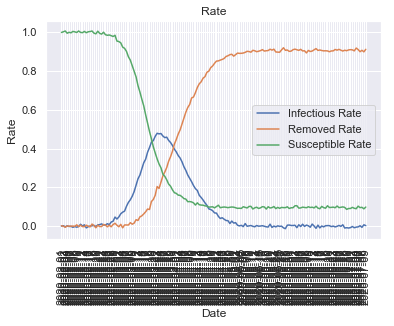

--------------------------------------------------------
first beta=2.740697176346031e-06, first gamma=0.0
last beta=2.5923598976036626e-08, last gamma=0.50562


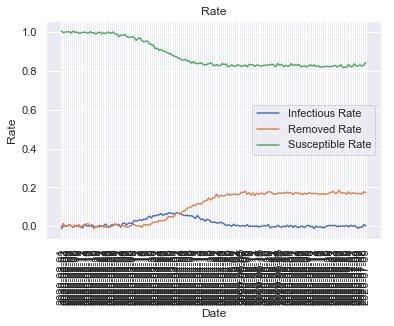

--------------------------------------------------------
first beta=3.1571245733026185e-06, first gamma=0.0
last beta=1.0150536203010645e-07, last gamma=0.50562


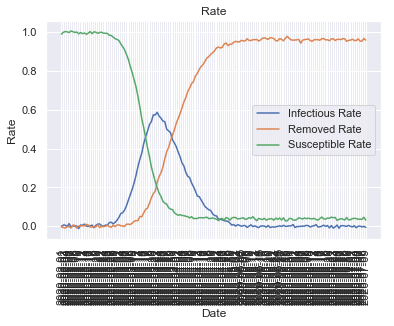

--------------------------------------------------------
first beta=2.6178052181219404e-06, first gamma=0.0
last beta=1.3403550609360474e-07, last gamma=0.50562


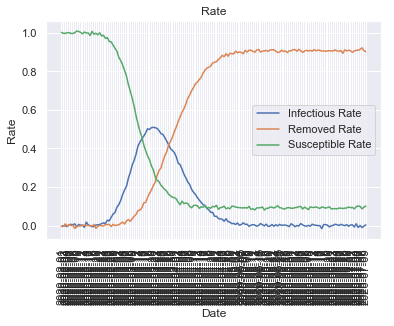

--------------------------------------------------------
first beta=3.237193237537335e-06, first gamma=0.0
last beta=2.5469123438918436e-07, last gamma=0.50562


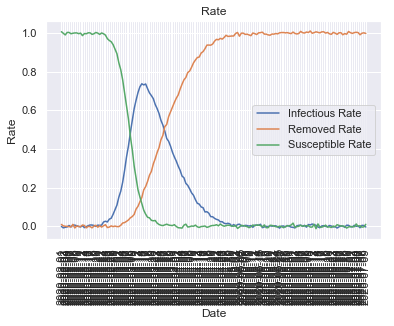

--------------------------------------------------------
first beta=3.4525313690422176e-06, first gamma=0.0
last beta=1.0630008892029342e-07, last gamma=0.50562


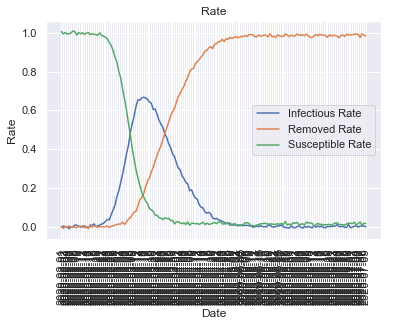

--------------------------------------------------------
first beta=2.5320383137074945e-06, first gamma=0.0
last beta=1.1894086002601987e-07, last gamma=0.50562


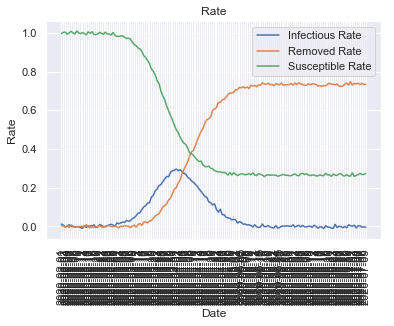

--------------------------------------------------------
first beta=2.7010967883405874e-06, first gamma=0.0
last beta=1.8468382817477363e-07, last gamma=0.50562


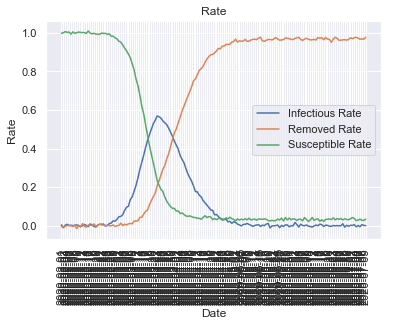

--------------------------------------------------------
first beta=3.181822592235938e-06, first gamma=0.0
last beta=9.81542255842661e-08, last gamma=0.50562


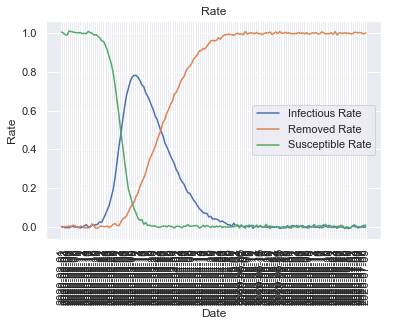

--------------------------------------------------------
first beta=3.1614750851014422e-06, first gamma=0.0
last beta=1.9766549627447196e-07, last gamma=0.50562


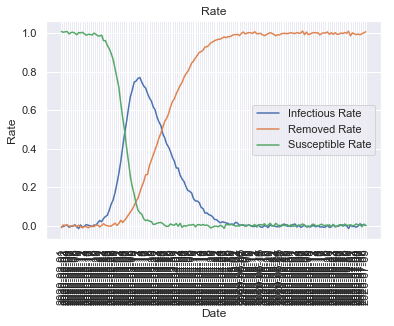

--------------------------------------------------------
first beta=3.378339222047239e-06, first gamma=0.0
last beta=9.050440194695283e-08, last gamma=0.50562


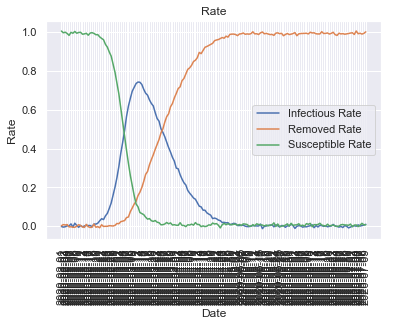

--------------------------------------------------------
first beta=3.213946178842318e-06, first gamma=0.0
last beta=1.8612165464955997e-07, last gamma=0.50562


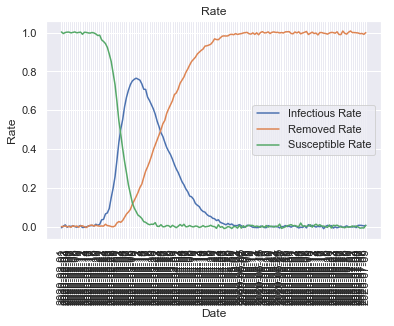

--------------------------------------------------------
first beta=2.489773965609955e-06, first gamma=0.0
last beta=8.573773295262297e-08, last gamma=0.50562


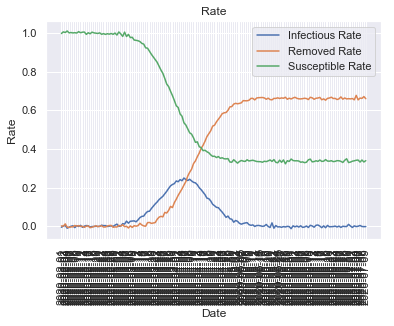

--------------------------------------------------------
first beta=3.125519616853362e-06, first gamma=0.0
last beta=1.8594131881622024e-07, last gamma=0.50562


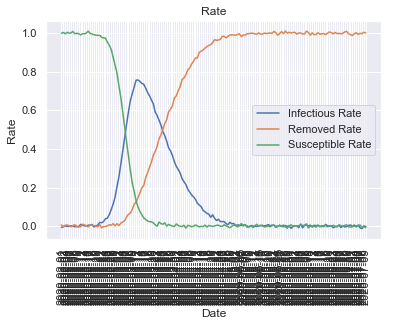

--------------------------------------------------------
first beta=2.4225956815918115e-06, first gamma=0.0
last beta=1.8047383511901503e-07, last gamma=0.50562


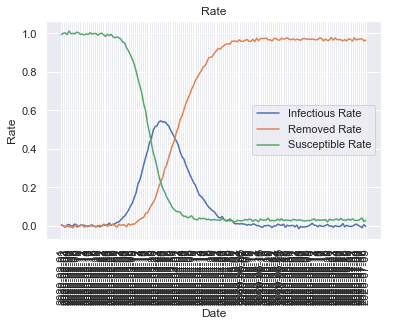

--------------------------------------------------------
first beta=3.1425923312144882e-06, first gamma=0.0
last beta=2.5477733361387037e-07, last gamma=0.50562


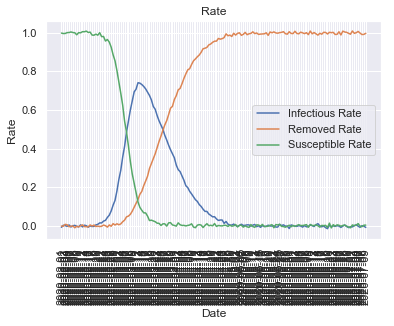

--------------------------------------------------------
first beta=2.7295698751063367e-06, first gamma=0.0
last beta=1.3827286753121608e-07, last gamma=0.50562


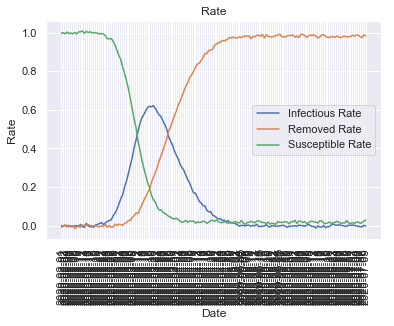

--------------------------------------------------------
first beta=3.3314032278695737e-06, first gamma=0.0
last beta=1.650422342737987e-07, last gamma=0.50562


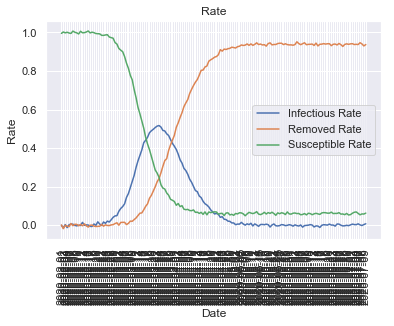

--------------------------------------------------------
first beta=2.9712817923067274e-06, first gamma=0.0
last beta=2.208075543571584e-07, last gamma=0.50562


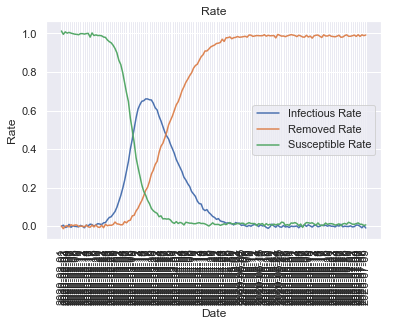

--------------------------------------------------------
first beta=2.7630105198504272e-06, first gamma=0.0
last beta=9.057429753942517e-08, last gamma=0.50562


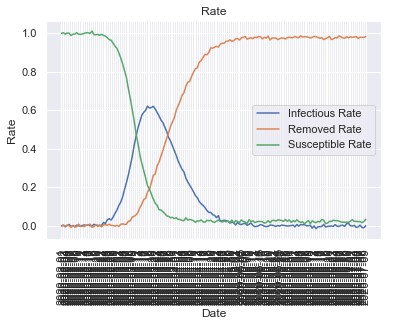

--------------------------------------------------------
first beta=2.9549287848455202e-06, first gamma=0.0
last beta=2.0030902589220223e-07, last gamma=0.50562


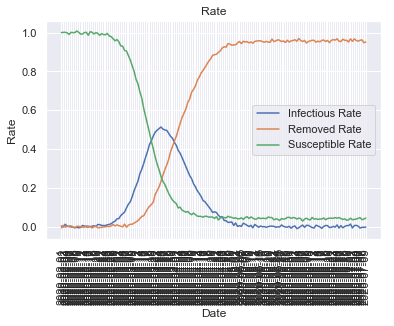

--------------------------------------------------------
first beta=3.327416078922136e-06, first gamma=0.0
last beta=2.1303863820431964e-07, last gamma=0.50562


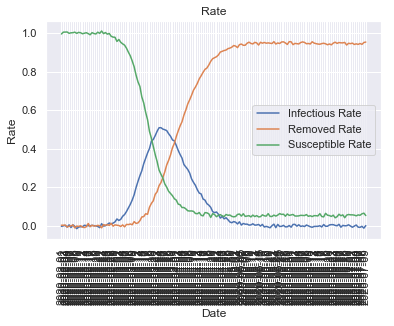

--------------------------------------------------------
first beta=3.3603315545575354e-06, first gamma=0.0
last beta=1.8844583968107028e-07, last gamma=0.50562


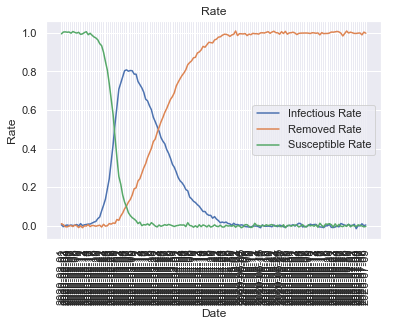

--------------------------------------------------------
first beta=2.72073203719935e-06, first gamma=0.0
last beta=2.390237078222313e-07, last gamma=0.50562


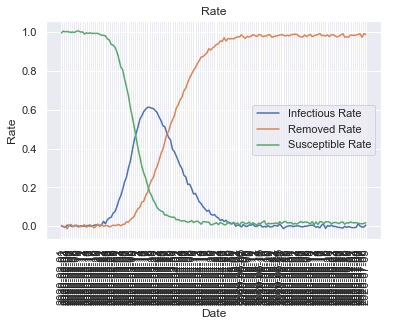

--------------------------------------------------------
first beta=3.0794712789784727e-06, first gamma=0.0
last beta=4.27459177651656e-07, last gamma=0.50562


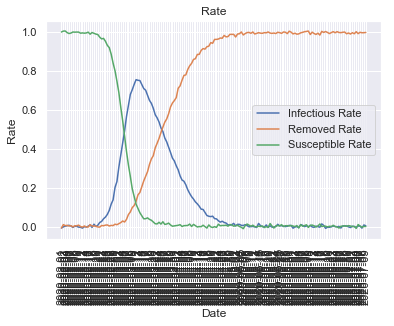

--------------------------------------------------------
first beta=3.351187922301388e-06, first gamma=0.0
last beta=8.820862842886203e-08, last gamma=0.50562


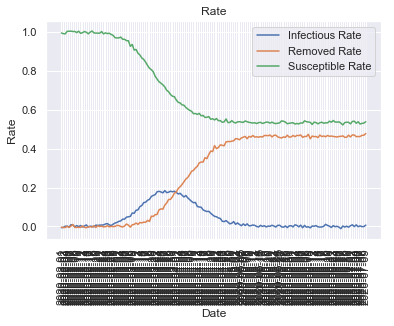

--------------------------------------------------------
first beta=2.47902139117937e-06, first gamma=0.0
last beta=9.683199597754197e-08, last gamma=0.50562


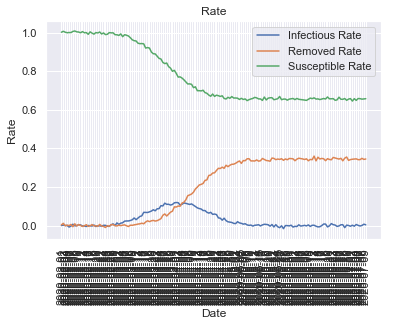

--------------------------------------------------------
first beta=2.636071303268912e-06, first gamma=0.0
last beta=8.855238345446459e-08, last gamma=0.50562


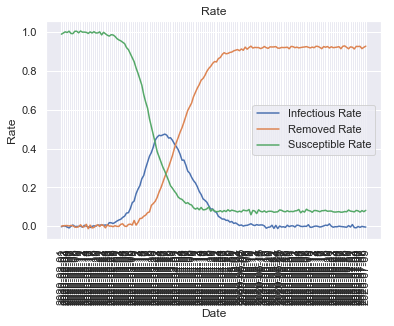

--------------------------------------------------------
first beta=2.6569069560671813e-06, first gamma=0.0
last beta=9.478799716834977e-08, last gamma=0.50562


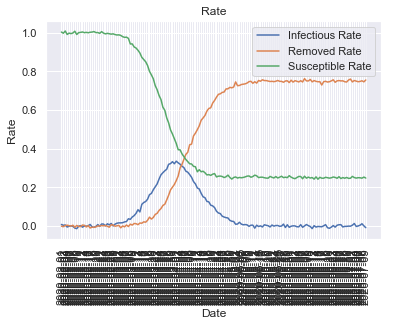

--------------------------------------------------------
first beta=3.2339379249680176e-06, first gamma=0.0
last beta=1.4649860743952764e-07, last gamma=0.50562


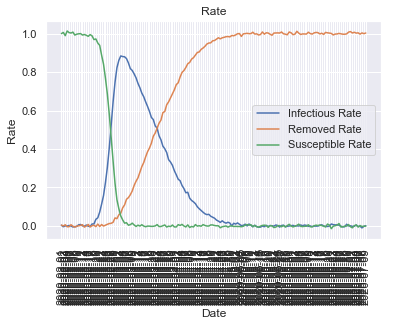

--------------------------------------------------------
first beta=2.4658659406453337e-06, first gamma=0.0
last beta=8.463480502346162e-08, last gamma=0.50562


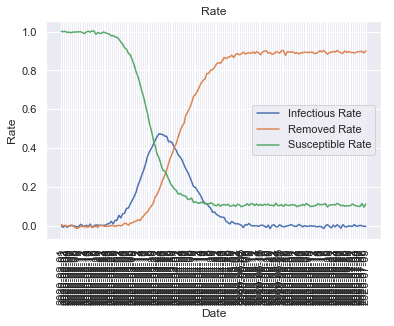

--------------------------------------------------------
first beta=2.3523662457380765e-06, first gamma=0.0
last beta=3.1347443094581625e-07, last gamma=0.50562


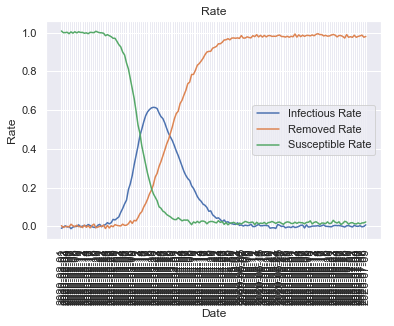

--------------------------------------------------------
first beta=3.389663061307554e-06, first gamma=0.0
last beta=4.370252890537006e-07, last gamma=0.50562


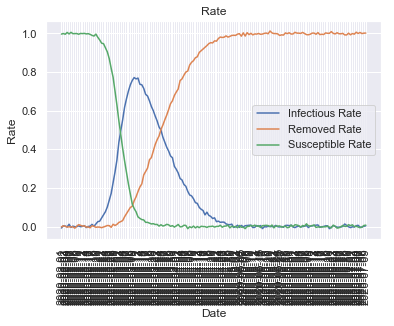

--------------------------------------------------------
first beta=2.3217019003646645e-06, first gamma=0.0
last beta=1.7026003940870782e-07, last gamma=0.50562


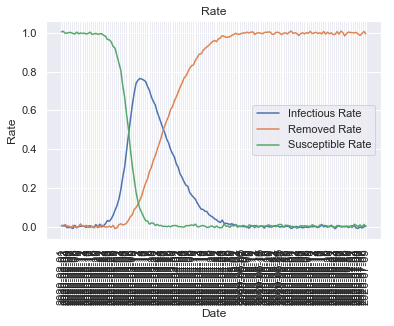

--------------------------------------------------------
first beta=2.924229722361535e-06, first gamma=0.0
last beta=1.1579292953565267e-07, last gamma=0.50562


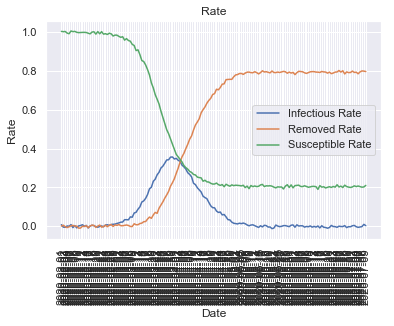

--------------------------------------------------------
first beta=3.076276733155022e-06, first gamma=0.0
last beta=4.125005326454455e-08, last gamma=0.50562


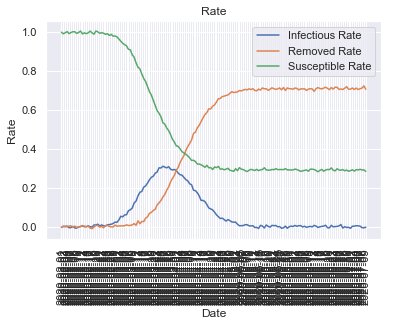

--------------------------------------------------------
first beta=3.284970329641415e-06, first gamma=0.0
last beta=1.0379085352634948e-07, last gamma=0.50562


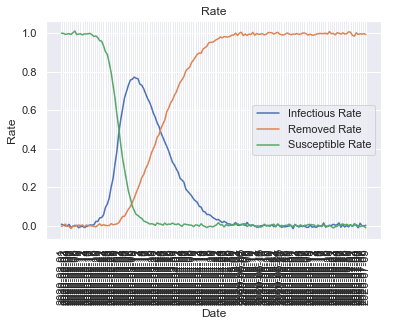

--------------------------------------------------------
first beta=2.7428602335244613e-06, first gamma=0.0
last beta=1.1266359988346985e-07, last gamma=0.50562


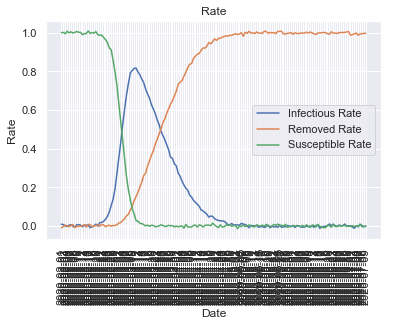

--------------------------------------------------------
first beta=3.2258974140582666e-06, first gamma=0.0
last beta=7.860690822255398e-08, last gamma=0.50562


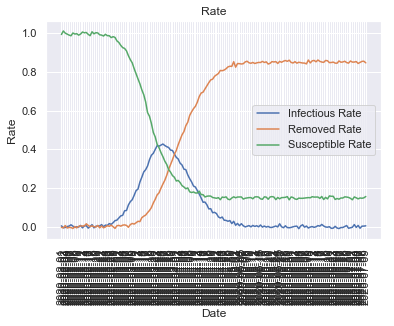

--------------------------------------------------------
first beta=3.104455488324799e-06, first gamma=0.0
last beta=1.5727385779699704e-07, last gamma=0.50562


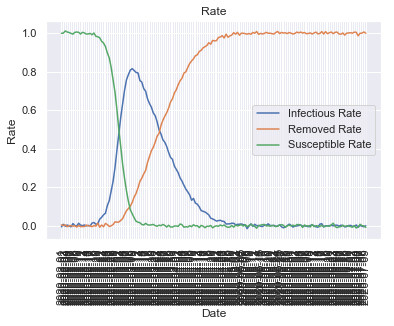

--------------------------------------------------------
first beta=3.384031579386714e-06, first gamma=0.0
last beta=9.50279222195283e-08, last gamma=0.50562


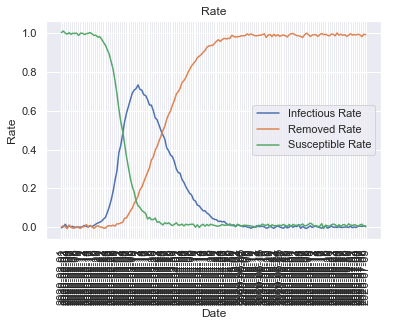

--------------------------------------------------------
first beta=2.3929727396525903e-06, first gamma=0.0
last beta=6.984867221084856e-08, last gamma=0.50562


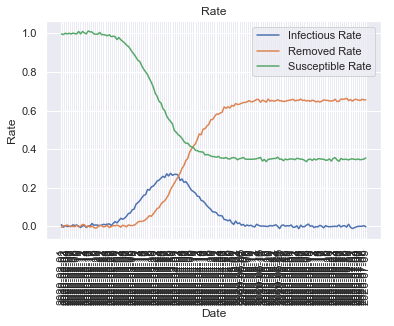

--------------------------------------------------------
first beta=2.5685942150990585e-06, first gamma=0.0
last beta=1.0635502672024632e-07, last gamma=0.50562


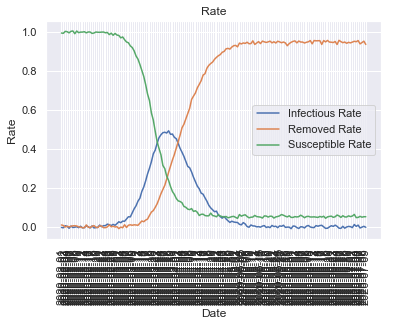

--------------------------------------------------------
first beta=3.314455769685654e-06, first gamma=0.0
last beta=1.3849563632084904e-07, last gamma=0.50562


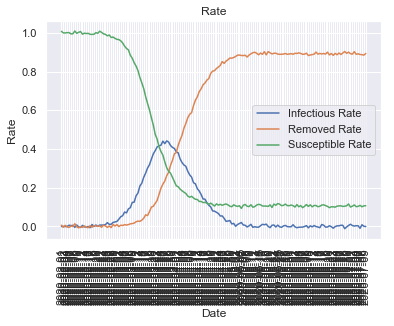

--------------------------------------------------------
first beta=2.9083330396863083e-06, first gamma=0.0
last beta=1.5281817943887093e-07, last gamma=0.50562


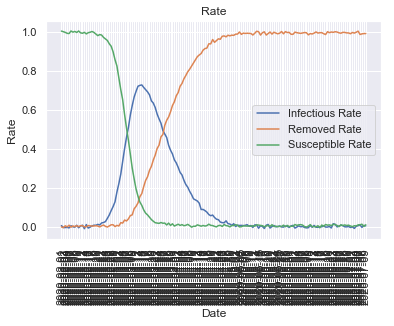

--------------------------------------------------------
first beta=2.5619908500966374e-06, first gamma=0.0
last beta=9.972565475331741e-08, last gamma=0.50562


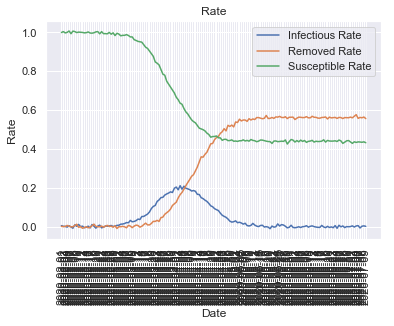

--------------------------------------------------------
first beta=2.698730116967506e-06, first gamma=0.0
last beta=1.145157936259324e-07, last gamma=0.50562


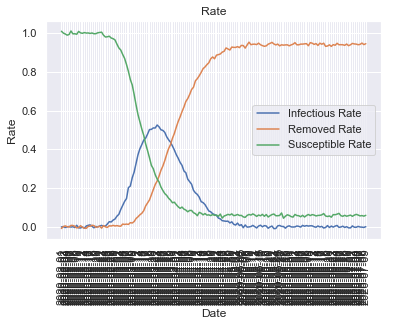

--------------------------------------------------------
first beta=2.8944894941551135e-06, first gamma=0.0
last beta=6.797998004779204e-08, last gamma=0.50562


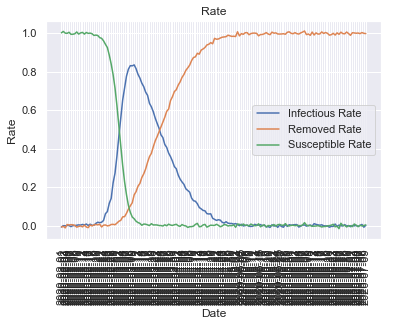

--------------------------------------------------------
first beta=2.3007207227957936e-06, first gamma=0.0
last beta=2.2519593760429401e-07, last gamma=0.50562


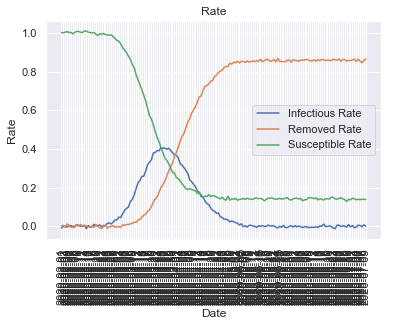

--------------------------------------------------------
first beta=2.8574296128551554e-06, first gamma=0.0
last beta=2.6033542625377376e-07, last gamma=0.50562


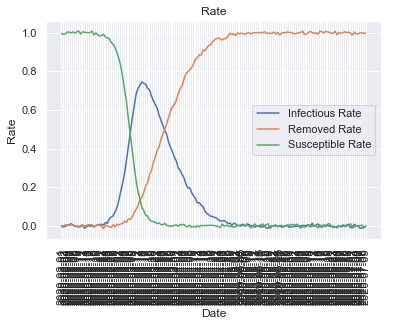

--------------------------------------------------------
first beta=3.031117660726627e-06, first gamma=0.0
last beta=9.311710712312817e-08, last gamma=0.50562


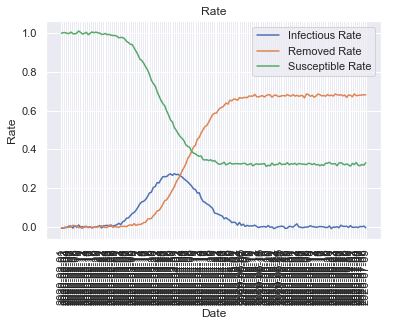

--------------------------------------------------------
first beta=3.1745893849909533e-06, first gamma=0.0
last beta=1.1766081148274343e-07, last gamma=0.50562


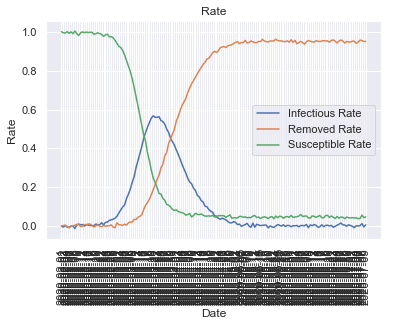

--------------------------------------------------------
first beta=3.407780303476717e-06, first gamma=0.0
last beta=2.1845248263100456e-07, last gamma=0.50562


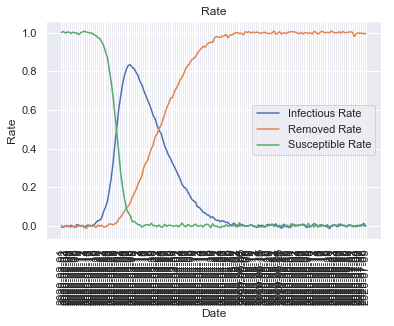

--------------------------------------------------------
first beta=2.750735863329667e-06, first gamma=0.0
last beta=1.1264502812286801e-07, last gamma=0.50562


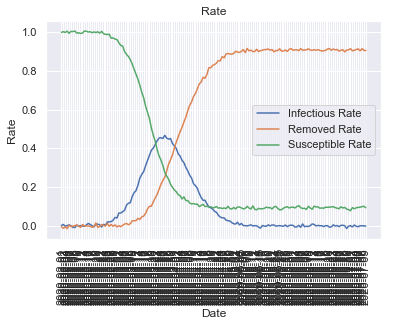

--------------------------------------------------------
first beta=2.436495910163265e-06, first gamma=0.0
last beta=1.561792126165579e-07, last gamma=0.50562


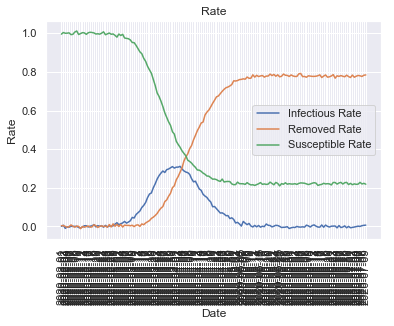

--------------------------------------------------------
first beta=3.244054306110739e-06, first gamma=0.0
last beta=1.2846311385979452e-07, last gamma=0.50562


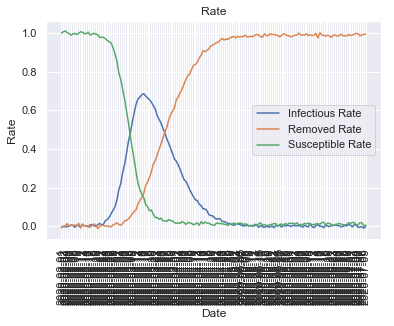

--------------------------------------------------------
first beta=3.0982996311959357e-06, first gamma=0.0
last beta=3.250447827761635e-07, last gamma=0.50562


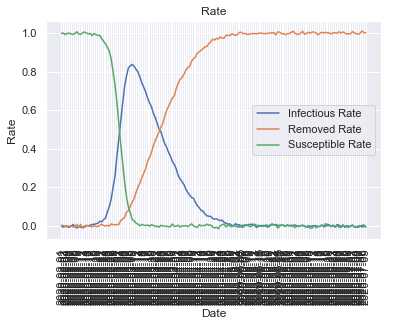

--------------------------------------------------------
first beta=2.6127519256800063e-06, first gamma=0.0
last beta=9.520618979714257e-08, last gamma=0.50562


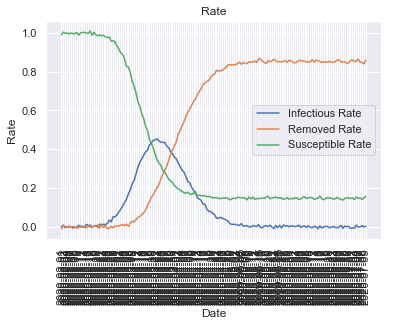

--------------------------------------------------------
first beta=2.5205294434456673e-06, first gamma=0.0
last beta=1.526219077136432e-07, last gamma=0.50562


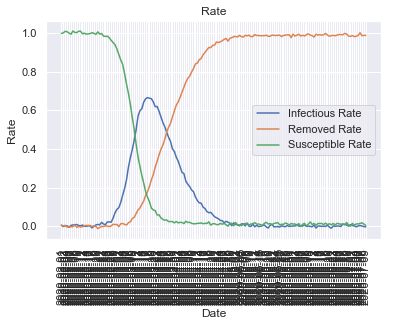

--------------------------------------------------------
first beta=3.3622104182130263e-06, first gamma=0.0
last beta=2.3547442696305152e-07, last gamma=0.50562


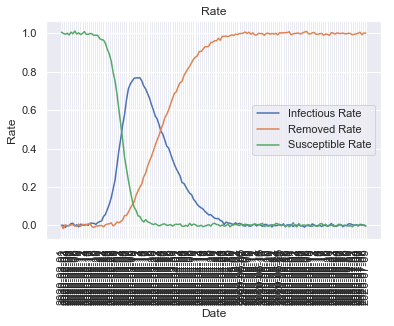

--------------------------------------------------------
first beta=2.9355584130647338e-06, first gamma=0.0
last beta=8.604857491856997e-08, last gamma=0.50562


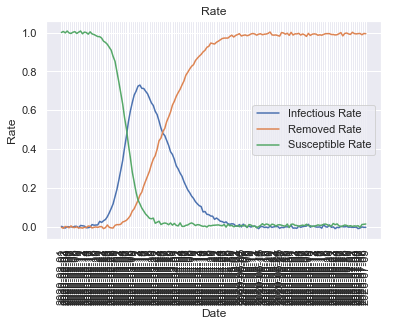

--------------------------------------------------------
first beta=2.3710771160788732e-06, first gamma=0.0
last beta=4.282641637348604e-08, last gamma=0.50562


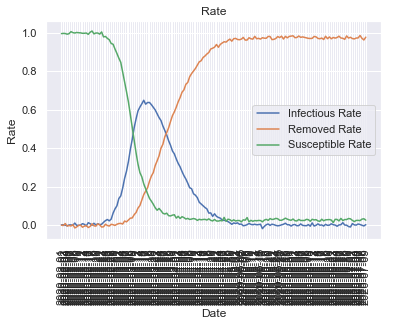

--------------------------------------------------------
first beta=2.7529725020098935e-06, first gamma=0.0
last beta=1.240876939692503e-07, last gamma=0.50562


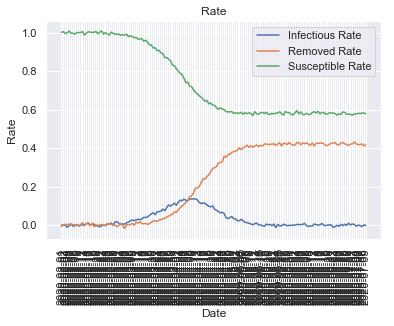

--------------------------------------------------------
first beta=3.134828508502301e-06, first gamma=0.0
last beta=1.0068756449991834e-07, last gamma=0.50562


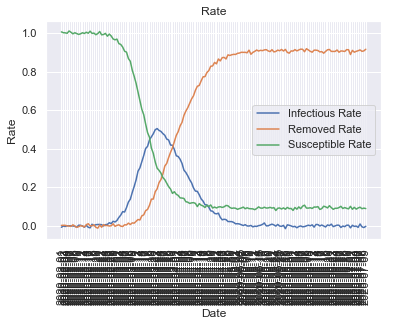

--------------------------------------------------------
first beta=2.8508813061976584e-06, first gamma=0.0
last beta=9.542286658373016e-08, last gamma=0.50562


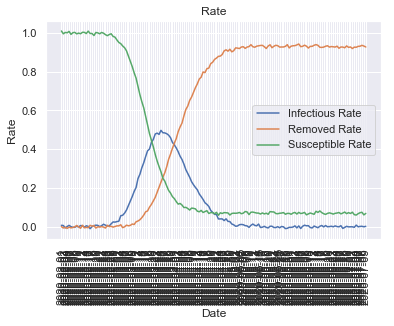

--------------------------------------------------------
first beta=2.98942863164992e-06, first gamma=0.0
last beta=2.5158142272109323e-07, last gamma=0.50562


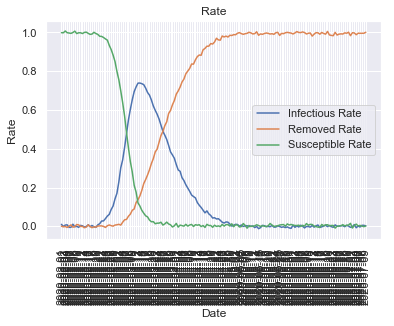

--------------------------------------------------------
first beta=2.7515854072586955e-06, first gamma=0.0
last beta=2.9422521371324754e-07, last gamma=0.50562


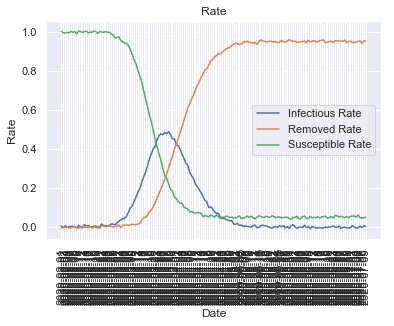

--------------------------------------------------------
first beta=3.179561984347257e-06, first gamma=0.0
last beta=1.2876956432576846e-07, last gamma=0.50562


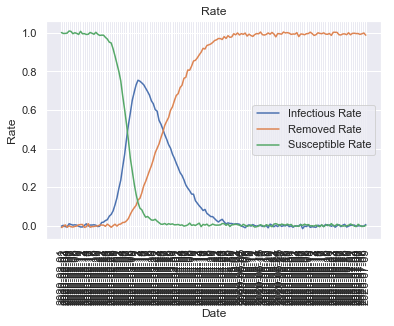

--------------------------------------------------------
first beta=2.574260335300009e-06, first gamma=0.0
last beta=5.638524593120239e-08, last gamma=0.50562


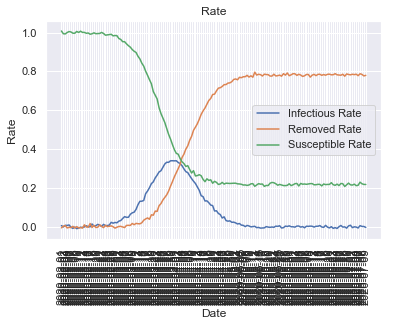

--------------------------------------------------------
first beta=3.4736999546337318e-06, first gamma=0.0
last beta=2.034555988889853e-07, last gamma=0.50562


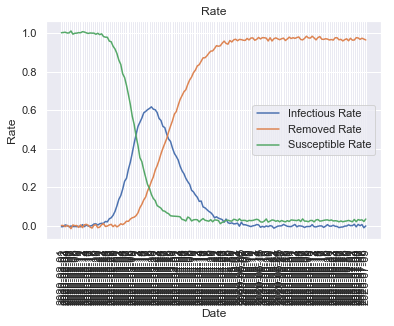

--------------------------------------------------------
first beta=2.392664183250555e-06, first gamma=0.0
last beta=4.5292415603230034e-08, last gamma=0.50562


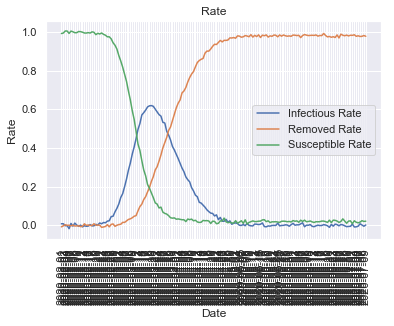

--------------------------------------------------------
first beta=2.4417850988292614e-06, first gamma=0.0
last beta=1.1173557424624004e-07, last gamma=0.50562


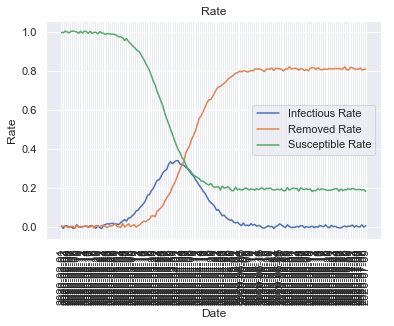

--------------------------------------------------------
first beta=3.465019714722054e-06, first gamma=0.0
last beta=2.723199765538376e-07, last gamma=0.50562


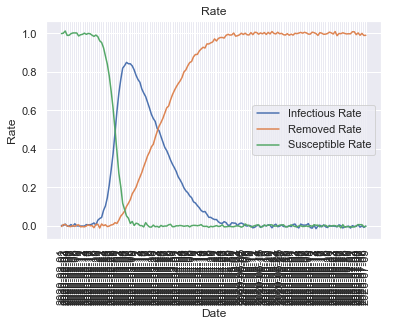

--------------------------------------------------------
first beta=3.414644618862411e-06, first gamma=0.0
last beta=9.562349154383409e-08, last gamma=0.50562


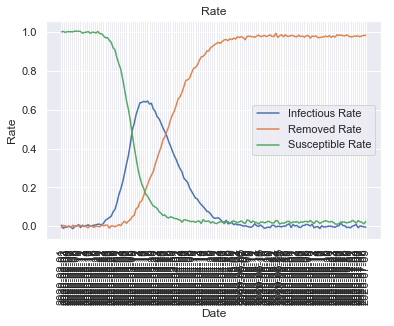

--------------------------------------------------------
first beta=3.3013995876086624e-06, first gamma=0.0
last beta=3.352732476124782e-07, last gamma=0.50562


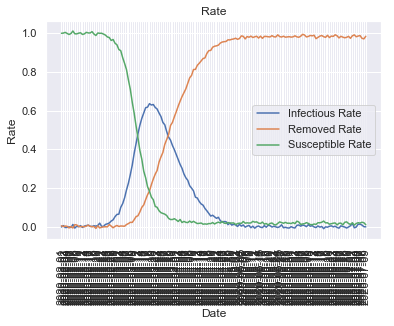

--------------------------------------------------------
first beta=3.4133831098998114e-06, first gamma=0.0
last beta=1.4949983841166172e-07, last gamma=0.50562


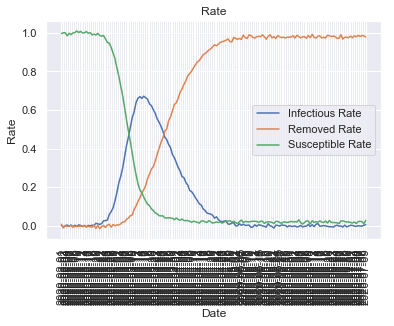

--------------------------------------------------------
first beta=2.828844503262117e-06, first gamma=0.0
last beta=1.7422786286919378e-07, last gamma=0.50562


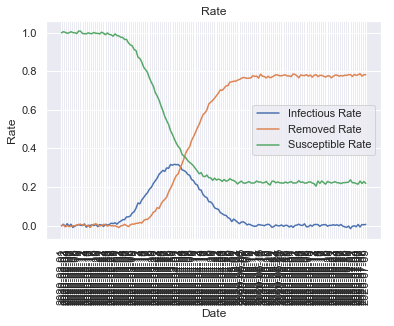

--------------------------------------------------------
first beta=3.258978943419896e-06, first gamma=0.0
last beta=2.6381153908604876e-07, last gamma=0.50562


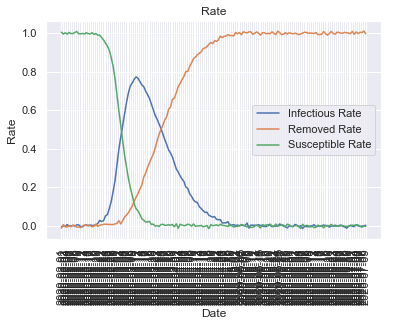

--------------------------------------------------------
first beta=2.5604313951520604e-06, first gamma=0.0
last beta=1.5728252599672198e-07, last gamma=0.50562


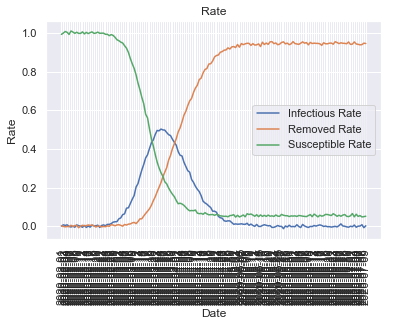

--------------------------------------------------------
first beta=2.664283635669616e-06, first gamma=0.0
last beta=3.889309341375565e-08, last gamma=0.50562


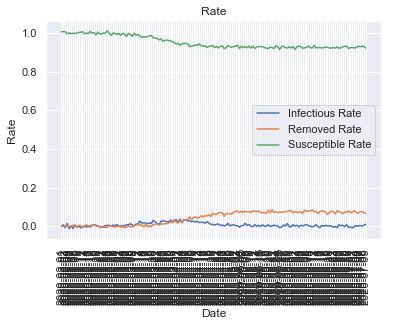

--------------------------------------------------------
first beta=2.5151395154998402e-06, first gamma=0.0
last beta=1.4979263689372762e-07, last gamma=0.50562


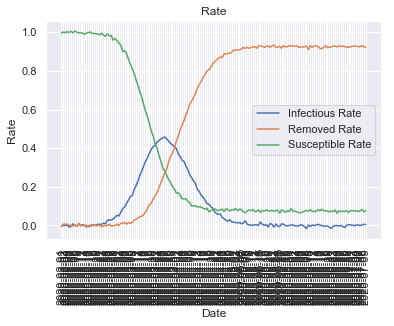

--------------------------------------------------------
first beta=3.0438584032313105e-06, first gamma=0.0
last beta=1.4937827170856077e-07, last gamma=0.50562


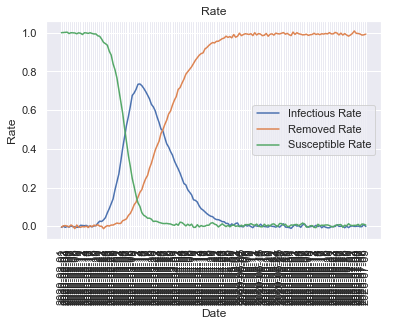

--------------------------------------------------------
first beta=2.4687119189313204e-06, first gamma=0.0
last beta=4.6120545473255516e-08, last gamma=0.50562


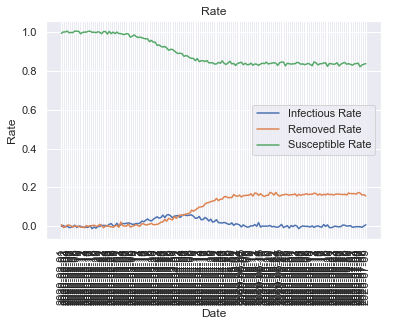

--------------------------------------------------------
first beta=2.7189477063766306e-06, first gamma=0.0
last beta=1.1548333625806914e-07, last gamma=0.50562


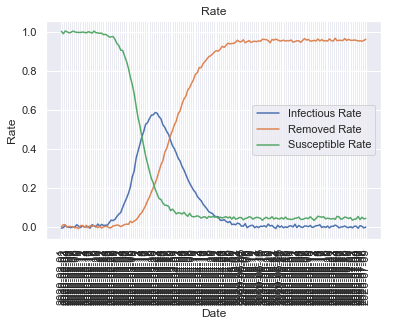

--------------------------------------------------------
first beta=3.415180156747014e-06, first gamma=0.0
last beta=6.327601710219126e-08, last gamma=0.50562


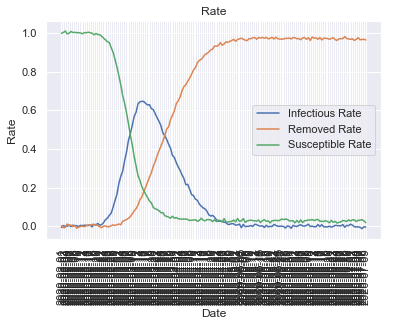

--------------------------------------------------------
first beta=2.924428605056352e-06, first gamma=0.0
last beta=1.359040170841529e-07, last gamma=0.50562


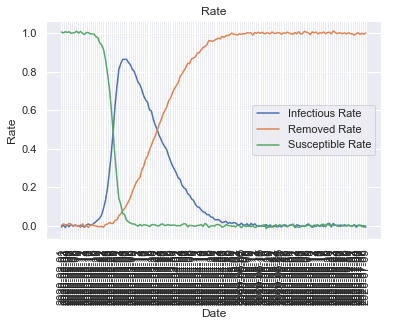

--------------------------------------------------------
first beta=2.6971504753017176e-06, first gamma=0.0
last beta=1.046678231703148e-07, last gamma=0.50562


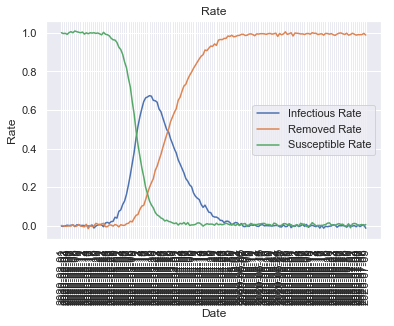

--------------------------------------------------------
first beta=3.4002247865060022e-06, first gamma=0.0
last beta=1.246417100711697e-07, last gamma=0.50562


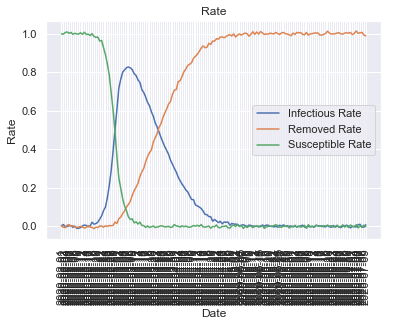

--------------------------------------------------------
first beta=3.2739849942730223e-06, first gamma=0.0
last beta=1.414615323820801e-07, last gamma=0.50562


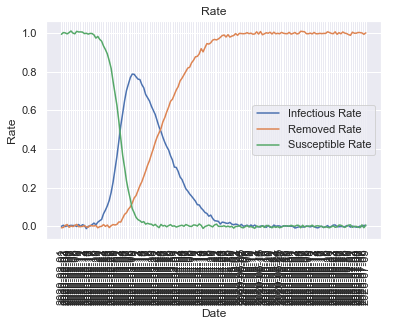

--------------------------------------------------------
first beta=2.5243730850708056e-06, first gamma=0.0
last beta=1.206058044041843e-07, last gamma=0.50562


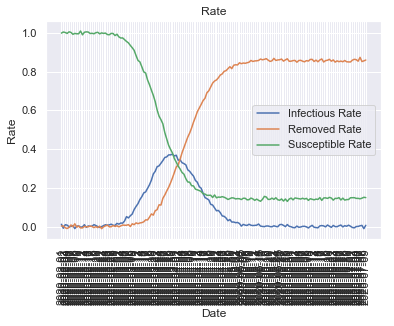

--------------------------------------------------------
first beta=2.7082453409973033e-06, first gamma=0.0
last beta=1.8740190807800065e-07, last gamma=0.50562


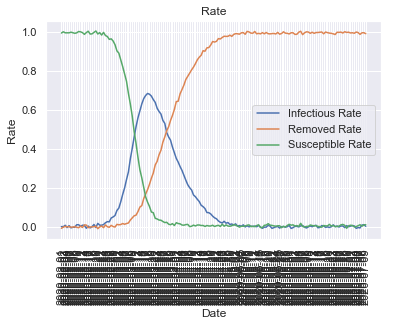

--------------------------------------------------------
first beta=2.4942949352985024e-06, first gamma=0.0
last beta=1.6087430420475924e-07, last gamma=0.50562


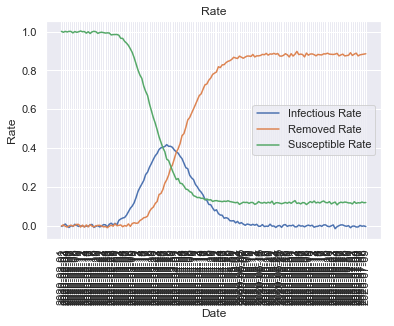

--------------------------------------------------------
first beta=2.704328823500558e-06, first gamma=0.0
last beta=1.1386163795644971e-07, last gamma=0.50562


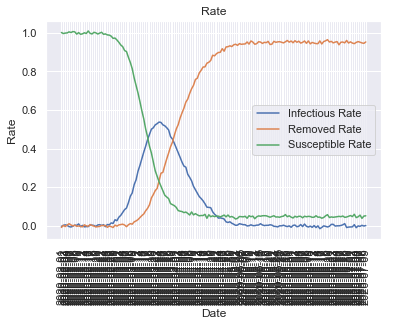

--------------------------------------------------------
first beta=3.341754061950038e-06, first gamma=0.0
last beta=1.7191946046982956e-07, last gamma=0.50562


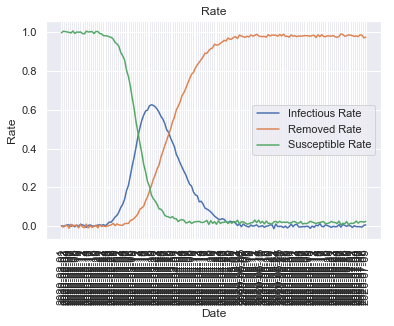

--------------------------------------------------------
first beta=2.7763160799157582e-06, first gamma=0.0
last beta=1.6888976579278376e-07, last gamma=0.50562


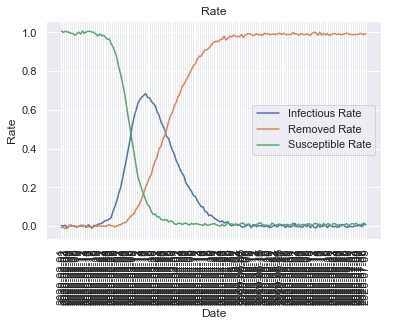

--------------------------------------------------------
first beta=2.9324523394505524e-06, first gamma=0.0
last beta=1.4494650639071162e-07, last gamma=0.50562


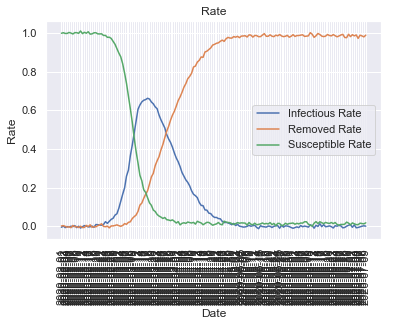

--------------------------------------------------------
first beta=2.599035318612994e-06, first gamma=0.0
last beta=1.1579598061270919e-07, last gamma=0.50562


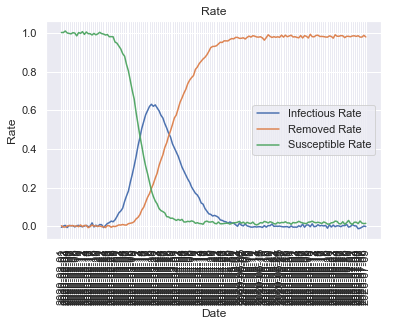

--------------------------------------------------------
first beta=2.7763324006579843e-06, first gamma=0.0
last beta=1.0505850491477309e-07, last gamma=0.50562


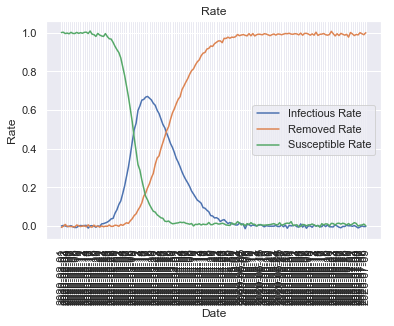

--------------------------------------------------------
first beta=2.530528946165446e-06, first gamma=0.0
last beta=8.642354115356666e-08, last gamma=0.50562


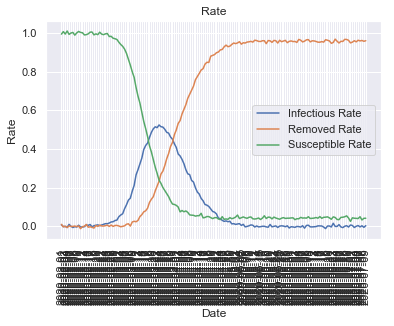

--------------------------------------------------------
first beta=3.4483750473643416e-06, first gamma=0.0
last beta=9.621892748136399e-08, last gamma=0.50562


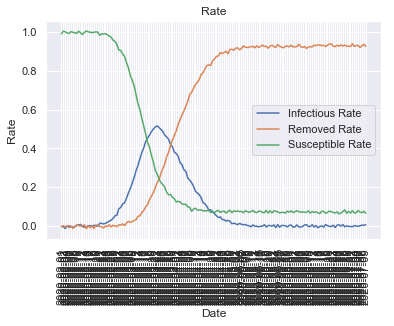

--------------------------------------------------------
first beta=3.1916933301298802e-06, first gamma=0.0
last beta=9.914106570175427e-08, last gamma=0.50562


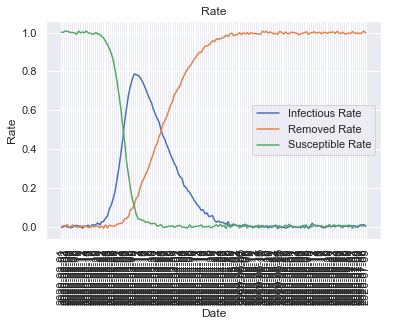

--------------------------------------------------------
first beta=3.2218509489066903e-06, first gamma=0.0
last beta=2.3384248690569858e-07, last gamma=0.50562


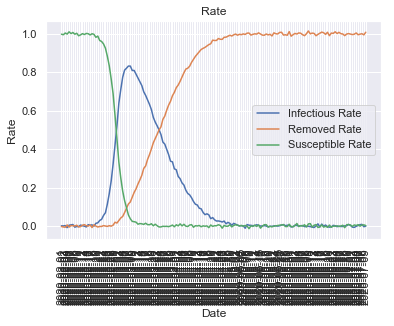

--------------------------------------------------------
first beta=3.1927288359436113e-06, first gamma=0.0
last beta=3.759125525306601e-07, last gamma=0.50562


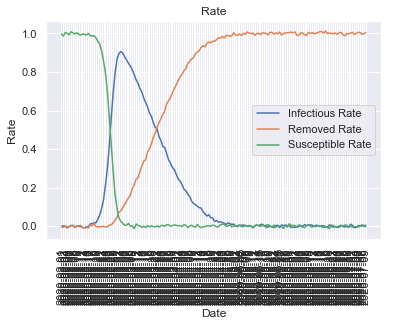

--------------------------------------------------------
first beta=2.6349152853335686e-06, first gamma=0.0
last beta=1.217323923931829e-07, last gamma=0.50562


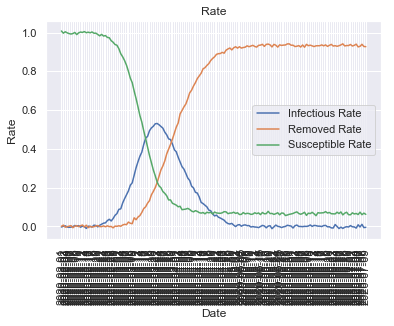

--------------------------------------------------------
first beta=2.40886095040777e-06, first gamma=0.0
last beta=8.122000255823819e-08, last gamma=0.50562


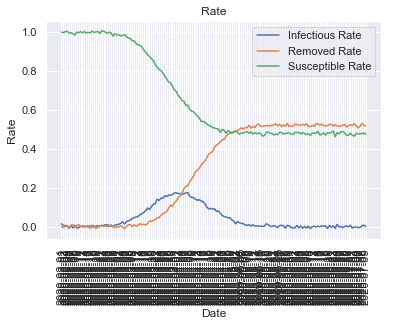

--------------------------------------------------------
first beta=2.4909049232876963e-06, first gamma=0.0
last beta=2.577750722279694e-07, last gamma=0.50562


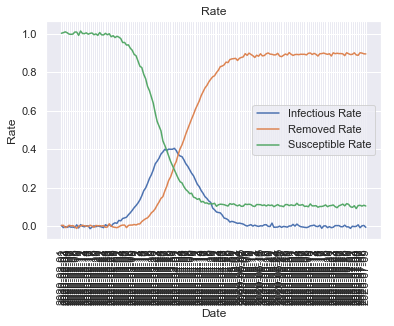

--------------------------------------------------------
first beta=2.656790156997622e-06, first gamma=0.0
last beta=1.462691686753843e-07, last gamma=0.50562


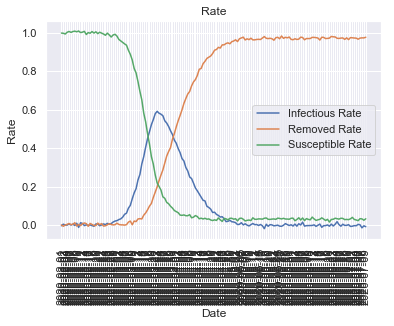

--------------------------------------------------------
first beta=2.386083708850505e-06, first gamma=0.0
last beta=8.311617441651556e-08, last gamma=0.50562


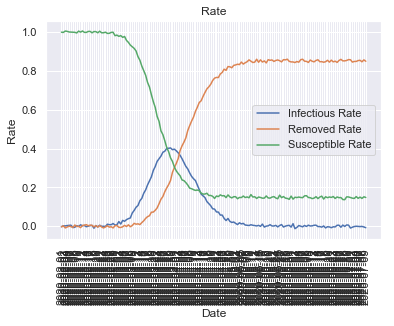

--------------------------------------------------------
first beta=2.7429311767045764e-06, first gamma=0.0
last beta=1.092892687510109e-07, last gamma=0.50562


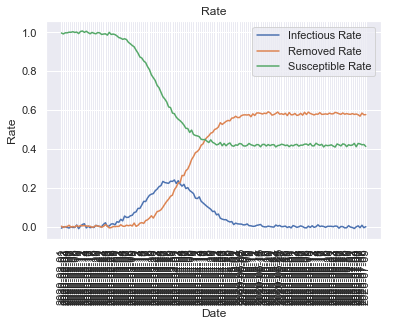

--------------------------------------------------------
first beta=3.1962767514777023e-06, first gamma=0.0
last beta=3.7433118481038284e-07, last gamma=0.50562


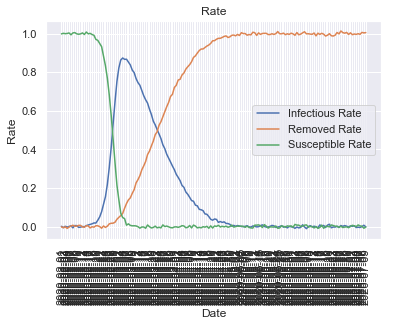

--------------------------------------------------------
first beta=2.4446725552483616e-06, first gamma=0.0
last beta=1.2019788318215822e-07, last gamma=0.50562


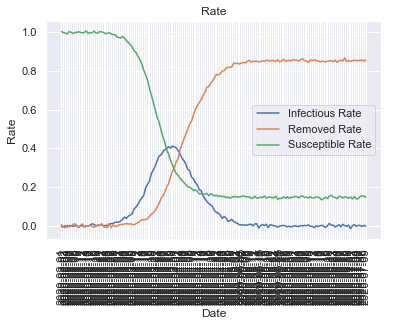

--------------------------------------------------------
first beta=3.361326944415412e-06, first gamma=0.0
last beta=1.1070769902851617e-07, last gamma=0.50562


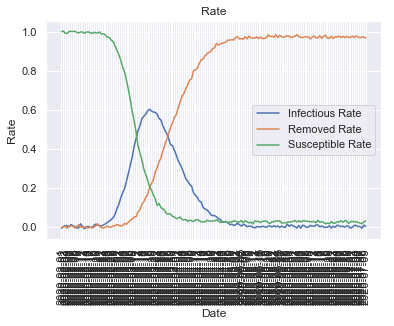

--------------------------------------------------------
first beta=3.2819147139166753e-06, first gamma=0.0
last beta=9.662421353402267e-08, last gamma=0.50562


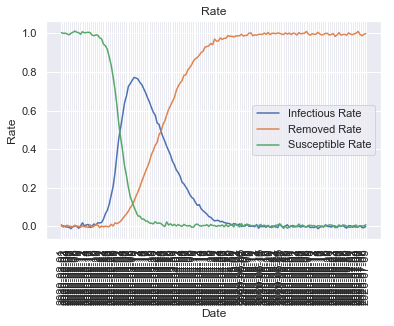

--------------------------------------------------------
first beta=3.465345636723718e-06, first gamma=0.0
last beta=1.1748659583249087e-07, last gamma=0.50562


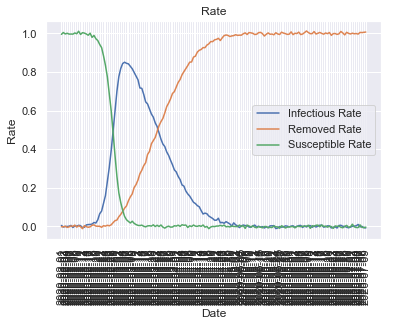

--------------------------------------------------------
first beta=3.48237267638951e-06, first gamma=0.0
last beta=1.5516011441019075e-07, last gamma=0.50562


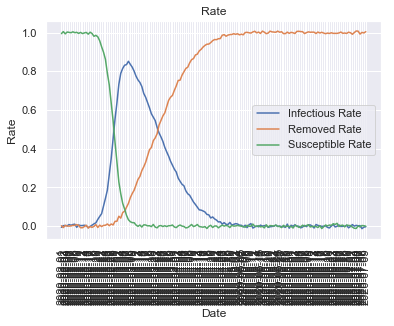

--------------------------------------------------------
first beta=3.1027064859878196e-06, first gamma=0.0
last beta=1.7539473384528057e-07, last gamma=0.50562


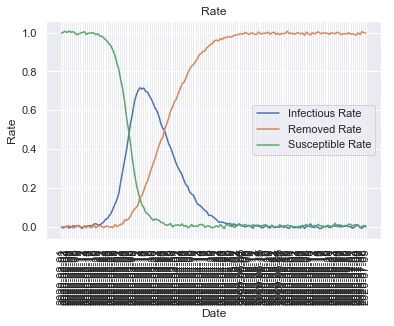

--------------------------------------------------------
first beta=3.3718713425527977e-06, first gamma=0.0
last beta=1.643533344155979e-07, last gamma=0.50562


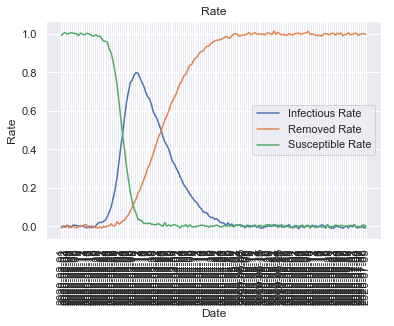

--------------------------------------------------------
first beta=2.518250766840707e-06, first gamma=0.0
last beta=1.3044281242924147e-07, last gamma=0.50562


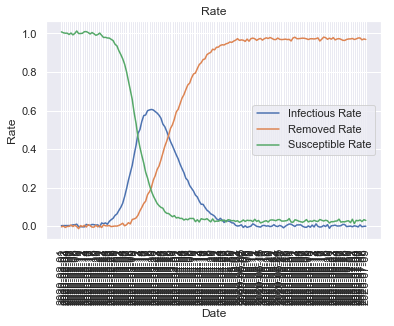

--------------------------------------------------------
first beta=2.7939792919588593e-06, first gamma=0.0
last beta=1.5862794974850042e-07, last gamma=0.50562


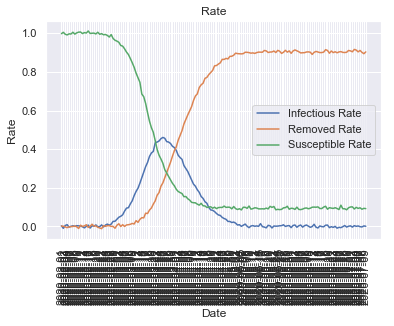

--------------------------------------------------------
first beta=3.1662493538214628e-06, first gamma=0.0
last beta=1.3618640437998457e-07, last gamma=0.50562


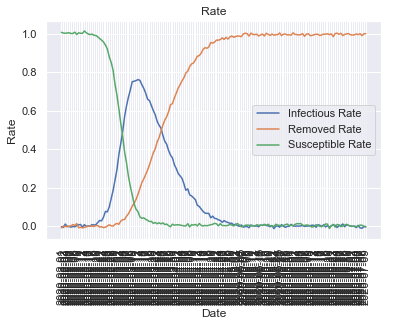

--------------------------------------------------------
first beta=2.8897601664660053e-06, first gamma=0.0
last beta=9.974715029823948e-08, last gamma=0.50562


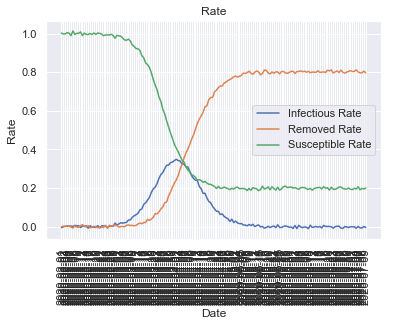

--------------------------------------------------------
first beta=2.8394966495051756e-06, first gamma=0.0
last beta=1.9242423993763847e-07, last gamma=0.50562


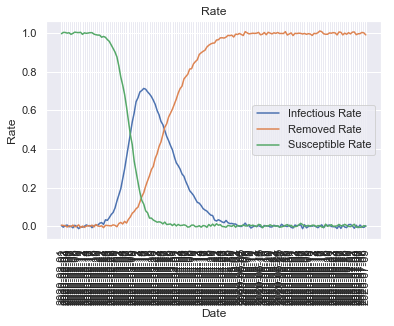

--------------------------------------------------------
first beta=2.440484064612552e-06, first gamma=0.0
last beta=1.2080970348950263e-07, last gamma=0.50562


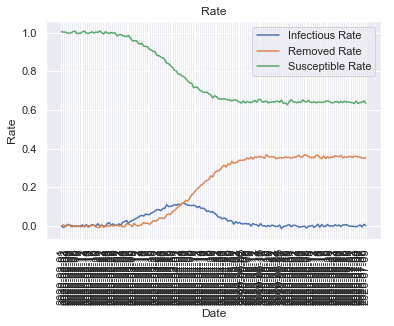

--------------------------------------------------------
first beta=2.368532025708724e-06, first gamma=0.0
last beta=1.941319620016788e-07, last gamma=0.50562


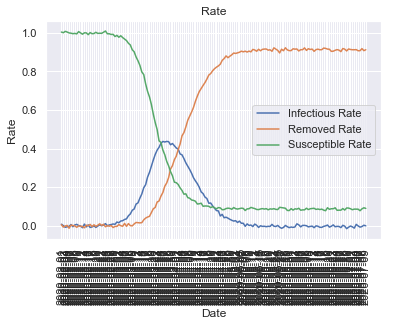

--------------------------------------------------------
first beta=2.6747733254118133e-06, first gamma=0.0
last beta=1.0575647204050946e-07, last gamma=0.50562


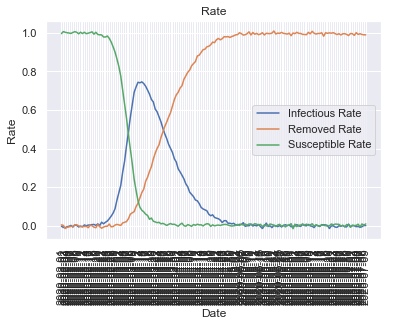

--------------------------------------------------------
first beta=2.782834692374679e-06, first gamma=0.0
last beta=1.2265463089343713e-07, last gamma=0.50562


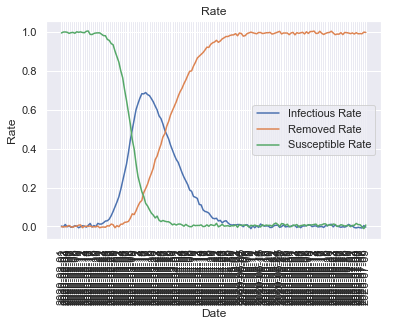

--------------------------------------------------------
first beta=2.7119804119512517e-06, first gamma=0.0
last beta=8.653562268229686e-08, last gamma=0.50562


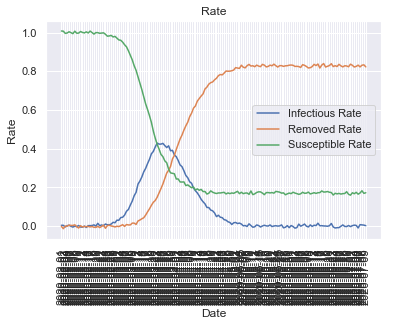

--------------------------------------------------------
first beta=3.0343308722624837e-06, first gamma=0.0
last beta=6.347642779042092e-08, last gamma=0.50562


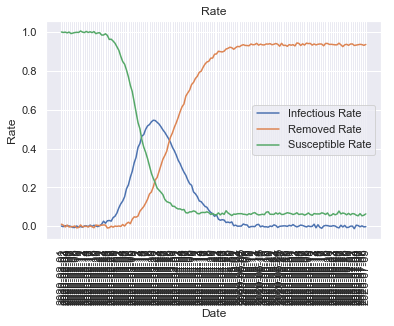

--------------------------------------------------------
first beta=2.9436931817187676e-06, first gamma=0.0
last beta=1.3088394339585878e-07, last gamma=0.50562


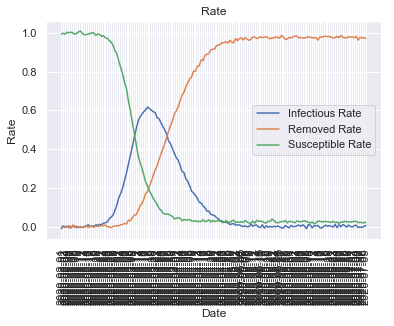

--------------------------------------------------------
first beta=2.347976091423037e-06, first gamma=0.0
last beta=1.146362603973016e-07, last gamma=0.50562


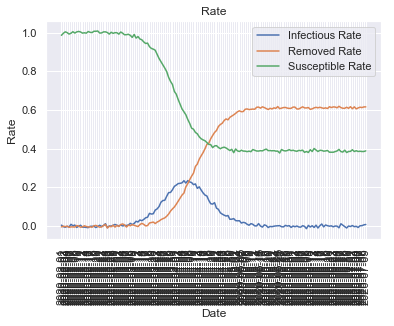

--------------------------------------------------------
first beta=2.9286290444944573e-06, first gamma=0.0
last beta=1.2333317169590098e-07, last gamma=0.50562


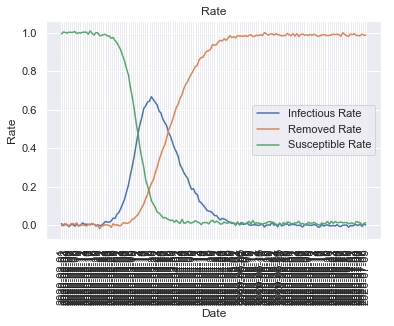

--------------------------------------------------------
first beta=2.5077172771487945e-06, first gamma=0.0
last beta=2.1973430764471969e-07, last gamma=0.50562


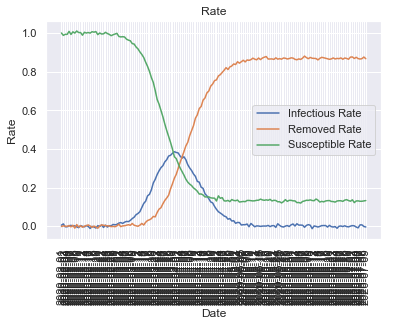

--------------------------------------------------------
first beta=2.628843396052714e-06, first gamma=0.0
last beta=1.6126348472406908e-07, last gamma=0.50562


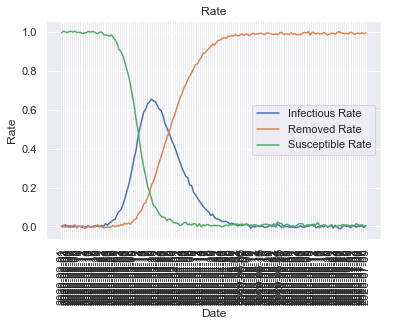

--------------------------------------------------------
first beta=3.1081012732123226e-06, first gamma=0.0
last beta=1.5297889947470732e-07, last gamma=0.50562


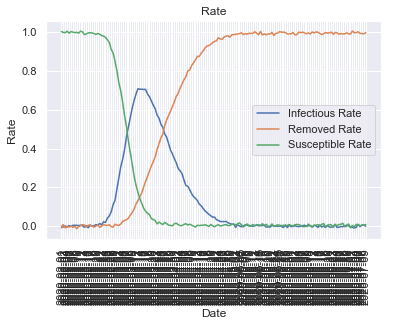

--------------------------------------------------------
first beta=2.4412242471338185e-06, first gamma=0.0
last beta=1.4183437474258233e-07, last gamma=0.50562


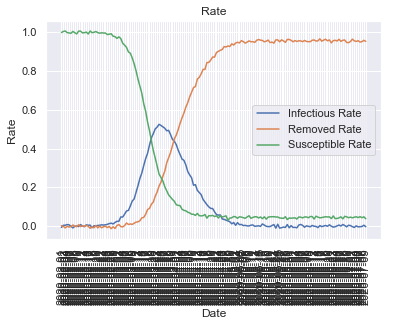

--------------------------------------------------------
first beta=3.4485282817077643e-06, first gamma=0.0
last beta=1.2205706414616653e-07, last gamma=0.50562


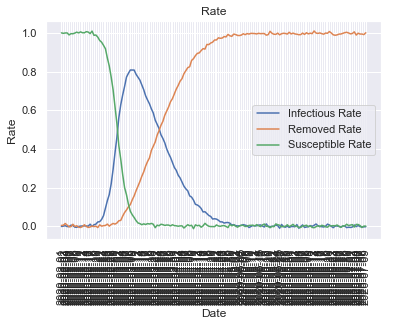

--------------------------------------------------------
first beta=3.210244508911176e-06, first gamma=0.0
last beta=9.481148740946697e-08, last gamma=0.50562


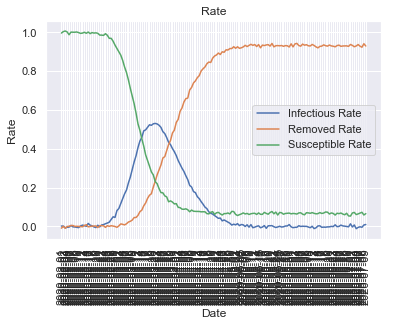

--------------------------------------------------------
first beta=2.7056082006222334e-06, first gamma=0.0
last beta=1.9192225684204841e-07, last gamma=0.50562


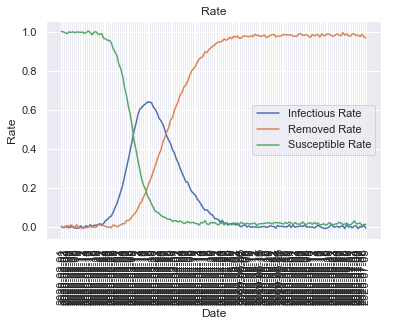

--------------------------------------------------------
first beta=2.393826028510865e-06, first gamma=0.0
last beta=1.1780489852661954e-07, last gamma=0.50562


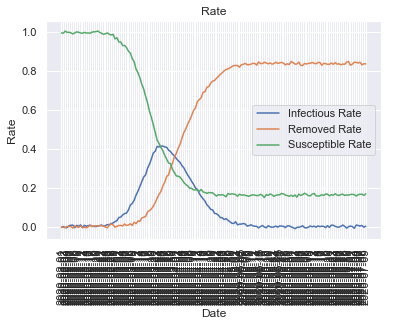

--------------------------------------------------------
first beta=3.2422769835262805e-06, first gamma=0.0
last beta=3.216103196962948e-07, last gamma=0.50562


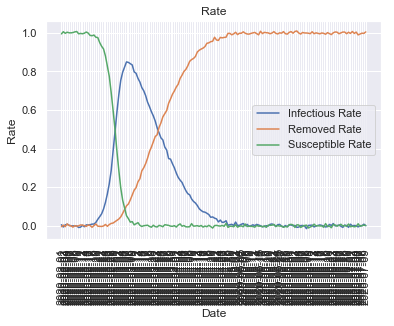

--------------------------------------------------------
first beta=2.922196932334189e-06, first gamma=0.0
last beta=1.2788594871318206e-07, last gamma=0.50562


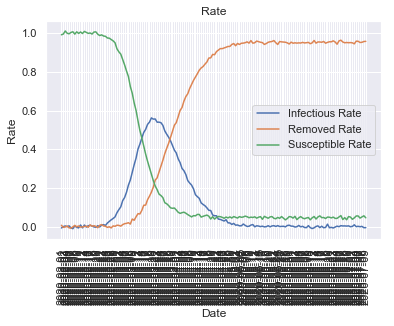

--------------------------------------------------------
first beta=2.9903793662478373e-06, first gamma=0.0
last beta=8.627800251846746e-08, last gamma=0.50562


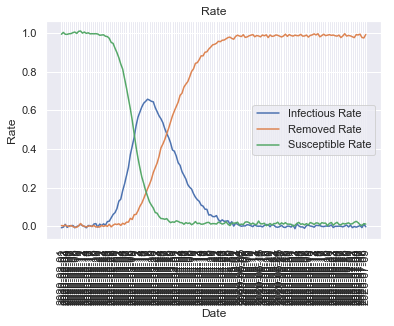

--------------------------------------------------------
first beta=2.6951620224129562e-06, first gamma=0.0
last beta=1.124618858337935e-07, last gamma=0.50562


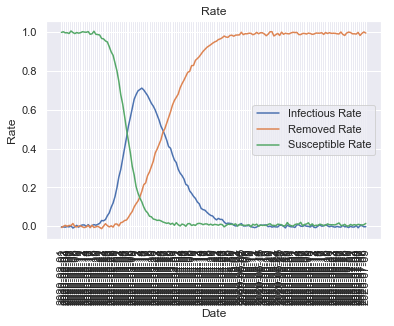

--------------------------------------------------------
first beta=3.148932396644651e-06, first gamma=0.0
last beta=1.2150132550493533e-07, last gamma=0.50562


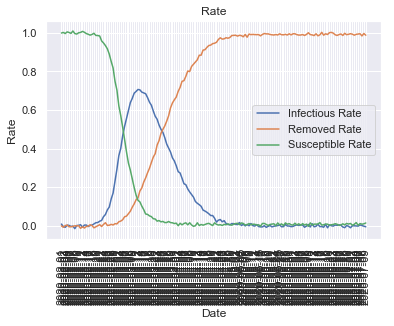

--------------------------------------------------------
first beta=2.9752612292712106e-06, first gamma=0.0
last beta=1.3571849953461846e-07, last gamma=0.50562


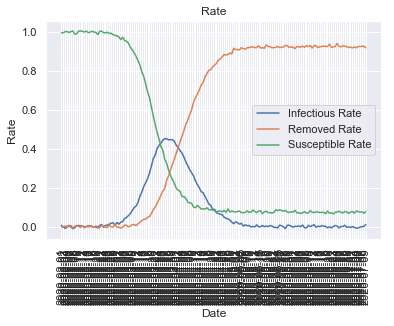

--------------------------------------------------------
first beta=2.3196916987504904e-06, first gamma=0.0
last beta=1.6606796026255532e-07, last gamma=0.50562


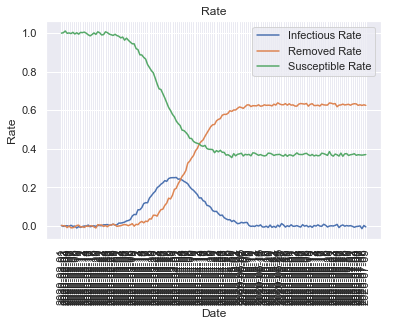

--------------------------------------------------------
first beta=3.3500126329806577e-06, first gamma=0.0
last beta=3.5412840734387584e-07, last gamma=0.50562


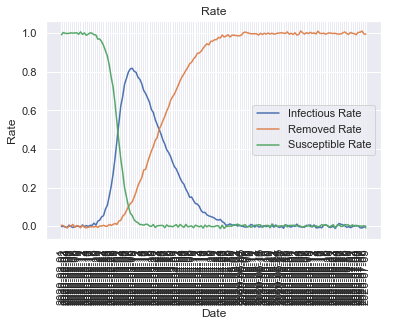

--------------------------------------------------------
first beta=2.3896101555786053e-06, first gamma=0.0
last beta=1.55042001830742e-07, last gamma=0.50562


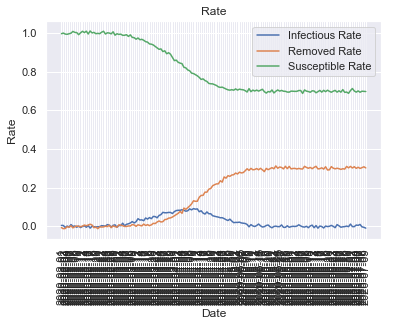

--------------------------------------------------------
first beta=3.4155020224925777e-06, first gamma=0.0
last beta=5.019345757051761e-08, last gamma=0.50562


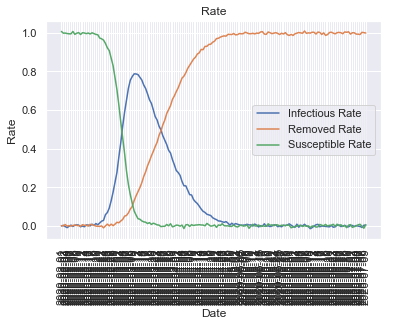

--------------------------------------------------------
first beta=3.4088317667960565e-06, first gamma=0.0
last beta=1.7509979352923327e-07, last gamma=0.50562


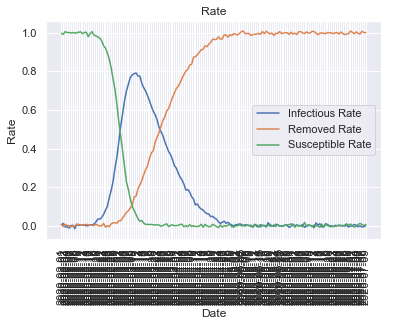

--------------------------------------------------------
first beta=3.1635513544157865e-06, first gamma=0.0
last beta=1.332868284084049e-07, last gamma=0.50562


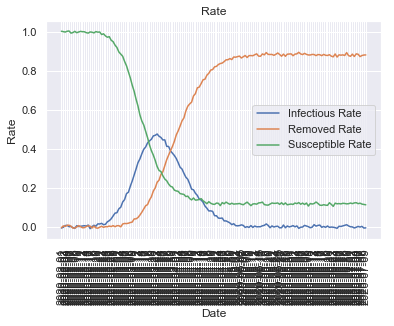

--------------------------------------------------------
first beta=3.2540822144548524e-06, first gamma=0.0
last beta=3.3715619177789953e-07, last gamma=0.50562


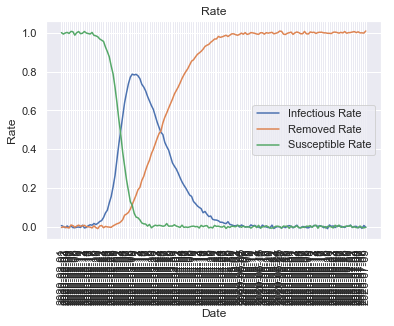

--------------------------------------------------------
first beta=3.4202788555400815e-06, first gamma=0.0
last beta=1.9271453192333638e-07, last gamma=0.50562


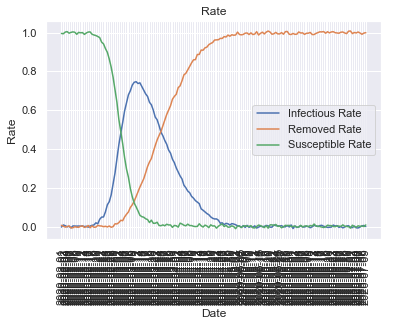

--------------------------------------------------------
first beta=2.42987851490981e-06, first gamma=0.0
last beta=1.7329134605635495e-07, last gamma=0.50562


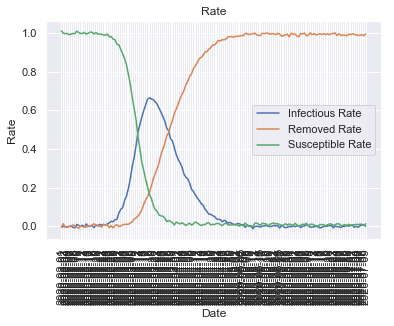

--------------------------------------------------------
first beta=2.5090428310338077e-06, first gamma=0.0
last beta=9.29804278106536e-08, last gamma=0.50562


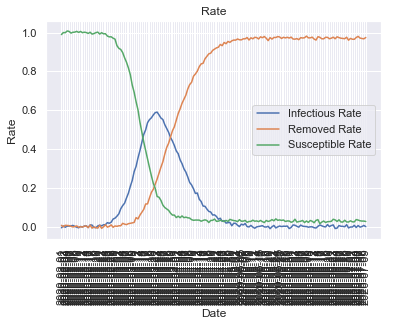

In [184]:
# Creating SIR inputs
from scipy.integrate import odeint
import random

# Initial SIR dataframe
cols = ['Code', 'Date', 'confirmed', 'removed', 'susceptible', 'infectious_rate', 'removed_rate', 'susceptible_rate', 'infectious_rate_change', 'removed_rate_change', 'susceptible_rate_change']
SIR_df = pd.DataFrame(index=[], columns=cols)

dates = [d.strftime("%Y-%m-%d") for d in pd.date_range(start='2020-02-01', periods=days, freq='D')]
print(dates)

for i in range(200):
    # Total population, N.
    N = 200000
    # Initial number of infected and recovered individuals, I0 and R0.
    I, R = 1, 0.0
    # Everyone else, S0, is susceptible to infection initially.
    S = N - I - R
    # A grid of time points (in days)
    days = 160
    t = np.linspace(0, days, days)

    # Initial conditions vector
    y = S, I, R

    # Static
    # beta = random.uniform(1e-7, 5e-6)
    # gamma = 0.1
    # # Integrate the SIR equations over the time grid, t.
    # ret = odeint(deriv, y0, t, args=(N, beta, gamma))
    # S, I, R = ret.T
    # sir_df = pd.DataFrame({
    #     'Code': "SIR-{}".format(i),
    #     'confirmed': I,
    #     'removed': R,
    #     'susceptible': S,
    #     'infectious_rate': I/N,
    #     'removed_rate': R/N,
    #     'susceptible_rate': S/N
    # })

    # Dynamic
    beta = random.uniform(2.3e-6, 3.5e-6)
    # gamma = 0.1
    sir_df = pd.DataFrame(index=[], columns=cols)
    sus, inf, rec= [],[],[]
    print("--------------------------------------------------------")
    print("first beta={}, first gamma={}".format(beta, gamma(0)))
    for day in range(days):
        if day % 10 == 0:
            beta = beta * random.uniform(0.66, 1)
        ks = np.random.normal(0,1000)
        ki = np.random.normal(0,1000)
        kr = np.random.normal(0,1000)
        S_ = S
        I_ = I
        R_ = R
        sus.append(S+ks)
        inf.append(I+ki)
        rec.append(R+kr)
        S = S_ - beta * S_ * I_
        I = I_ + beta * S_ * I_ - gamma(day) * I_
        R = R_ + gamma(day) * I_
    sir_df["confirmed"] = inf
    sir_df["removed"] = rec
    sir_df["susceptible"] = sus
    sir_df["infectious_rate"] = (np.array(inf)/N).tolist()
    sir_df["removed_rate"] = (np.array(rec)/N).tolist()
    sir_df["susceptible_rate"] = (np.array(sus)/N).tolist()
    sir_df["Code"] = "SIR-{}".format(i)

    # Rate change
    sir_df["infectious_rate_change"] = sir_df["infectious_rate"].pct_change()
    sir_df["infectious_rate_change"] = sir_df["infectious_rate_change"].replace([np.inf, -np.inf], np.nan).fillna(0.0)
    sir_df["removed_rate_change"] = sir_df["removed_rate"].pct_change()
    sir_df["removed_rate_change"] = sir_df["removed_rate_change"].replace([np.inf, -np.inf], np.nan).fillna(0.0)
    sir_df["susceptible_rate_change"] = sir_df["susceptible_rate"].pct_change()
    sir_df["susceptible_rate_change"] = sir_df["susceptible_rate_change"].replace([np.inf, -np.inf], np.nan).fillna(0.0)
    
    # Add Date
    sir_df["Date"] = dates

    print("last beta={}, last gamma={}".format(beta, gamma(days-1)))
    display_rate(sir_df)
    SIR_df = pd.concat([SIR_df, sir_df])

In [186]:
# train_df = new_df
train_df = SIR_df.copy()
train_df.tail()

,Code,Date,confirmed,removed,susceptible,infectious_rate,removed_rate,susceptible_rate,infectious_rate_change,removed_rate_change,susceptible_rate_change
155,SIR-199,2020-07-05,1067.364701,196053.314280,6715.693809,0.005337,0.980267,0.033578,-2.120066,0.005907,-0.069296
156,SIR-199,2020-07-06,-582.962484,194323.959725,5969.004159,-0.002915,0.971620,0.029845,-1.546170,-0.008821,-0.111186
157,SIR-199,2020-07-07,29.874616,193859.391556,5674.364304,0.000149,0.969297,0.028372,-1.051246,-0.002391,-0.049362
158,SIR-199,2020-07-08,1177.895711,193525.379505,5666.269219,0.005889,0.967627,0.028331,38.427978,-0.001723,-0.001427
159,SIR-199,2020-07-09,-66.993539,194897.723955,5247.050100,-0.000335,0.974489,0.026235,-1.056876,0.007091,-0.073985


In [256]:
# Creating train input from DataFrames
# train_country = ["KOR", "TWA", "THA", "ITA", "ISL", "DNK"]
# train_df = train_df.query("Code in {}".format(train_country))
days_in_sequence = 21
output_days = 7

trend_list = []

with tqdm(total=len(list(train_df.Code.unique()))) as pbar:
    for code in train_df.Code.unique():
        country_df = train_df.query(f"Code=='{code}'")
        # Added a quick hack to double the number of sequences
        # Warning: This will later create a minor leakage from the training set into the validation set.
        for i in range(0,len(country_df),int(days_in_sequence/2)):
            if i+days_in_sequence<=len(country_df):
                #prepare rate inputs
                infectious_rate_trend = [float(x) for x in country_df[i:i+days_in_sequence-1].infectious_rate]
                removed_rate_trend = [float(x) for x in country_df[i:i+days_in_sequence-1].removed_rate]
                susceptible_rate_trend = [float(x) for x in country_df[i:i+days_in_sequence-1].susceptible_rate] 

                #prepare outputs
#                 expected_infectious_rate = float(country_df.iloc[i+days_in_sequence-1].infectious_rate)
#                 expected_removed_rate = float(country_df.iloc[i+days_in_sequence-1].removed_rate)
                expected_infectious_rate = [float(x) for x in country_df.iloc[i+days_in_sequence-1:i+days_in_sequence-1+output_days].infectious_rate]
                expected_removed_rate = [float(x) for x in country_df.iloc[i+days_in_sequence-1:i+days_in_sequence-1+output_days].removed_rate]

                trend_list.append({ "infectious_rate_trend":infectious_rate_trend,
                                    "removed_rate_trend":removed_rate_trend,
                                    "susceptible_rate_trend":susceptible_rate_trend,
                                    "expected_infectious_rate":expected_infectious_rate,
                                    "expected_removed_rate":expected_removed_rate})
        pbar.update(1)
trend_df = pd.DataFrame(trend_list)

100%|██████████| 200/200 [00:04<00:00, 41.97it/s]


In [257]:
trend_df["temporal_inputs"] = [np.asarray([trends["infectious_rate_trend"], trends["removed_rate_trend"], trends["susceptible_rate_trend"]]) for idx,trends in trend_df.iterrows()]

trend_df = shuffle(trend_df)
print(len(trend_df))
trend_df.head()

2800


,expected_infectious_rate,expected_removed_rate,infectious_rate_trend,removed_rate_trend,susceptible_rate_trend,temporal_inputs
2792,"[0.06046787845081123, 0.0518248764714432, 0.03...","[0.9143492984305596, 0.9211075745084516, 0.924...","[0.38988399737204604, 0.3758057498700419, 0.34...","[0.5491679430499479, 0.5822527628734467, 0.606...","[0.046411753399177975, 0.05344425589672642, 0....","[[0.38988399737204604, 0.3758057498700419, 0.3..."
1763,"[0.004252525866135598, 0.002679184664728946, 0...","[0.9213190082147628, 0.9252263234864863, 0.926...","[-0.00522242733686998, 0.0022261380750945884, ...","[0.9305534122016033, 0.9215653802362196, 0.929...","[0.08229306750203488, 0.07236755942606055, 0.0...","[[-0.00522242733686998, 0.0022261380750945884,..."
7,"[0.017665854890787855, -0.002886274650721532, ...","[0.9837750599039321, 0.9792938843744412, 1.000...","[0.13905109197090296, 0.12756775195192926, 0.1...","[0.8668398324438161, 0.8826547119373757, 0.898...","[0.004624437548367665, 0.0028689472802787786, ...","[[0.13905109197090296, 0.12756775195192926, 0...."
55,"[0.0049386447909869355, 0.0024437343475048265,...","[0.9903966370477675, 0.9876793558503784, 0.985...","[-0.006195185420799505, 0.004084549639502814, ...","[0.9884228253179209, 0.9953111125261127, 0.984...","[0.01747592558120913, 0.016139976630780713, 0....","[[-0.006195185420799505, 0.004084549639502814,..."
1801,"[0.006205115338556066, -0.003416847318431458, ...","[0.9624554726098073, 0.9595584663817261, 0.964...","[0.012338498848244514, 0.00956050027936063, 0....","[0.9425786916656098, 0.9485005594206629, 0.958...","[0.049872806117942856, 0.03835275175314578, 0....","[[0.012338498848244514, 0.00956050027936063, 0..."


In [258]:
sequence_length = days_in_sequence - 1
training_percentage = 0.9

temp_dim = 3

In [259]:
training_item_count = int(len(trend_df)*training_percentage)
validation_item_count = len(trend_df)-int(len(trend_df)*training_percentage)
training_df = trend_df[:training_item_count]
validation_df = trend_df[training_item_count:]

In [260]:
X_temporal_train = np.asarray(np.transpose(np.reshape(np.asarray([np.asarray(x) for x in training_df["temporal_inputs"].values]),(training_item_count,temp_dim,sequence_length)),(0,2,1) )).astype(np.float32)
Y_cases_train = np.asarray([np.asarray(x) for x in training_df["expected_infectious_rate"]]).astype(np.float32)
Y_fatalities_train = np.asarray([np.asarray(x) for x in training_df["expected_removed_rate"]]).astype(np.float32)

In [261]:
X_temporal_test = np.asarray(np.transpose(np.reshape(np.asarray([np.asarray(x) for x in validation_df["temporal_inputs"]]),(validation_item_count,temp_dim,sequence_length)),(0,2,1)) ).astype(np.float32)
Y_cases_test = np.asarray([np.asarray(x) for x in validation_df["expected_infectious_rate"]]).astype(np.float32)
Y_fatalities_test = np.asarray([np.asarray(x) for x in validation_df["expected_removed_rate"]]).astype(np.float32)

# 3. Model

In [265]:
#temporal input branch
temporal_input_layer = Input(shape=(sequence_length,temp_dim))
main_rnn_layer = layers.LSTM(64, return_sequences=True, recurrent_dropout=0.2)(temporal_input_layer)

#demographic input branch
# demographic_input_layer = Input(shape=(dem_dim,))
# demographic_dense = layers.Dense(16)(demographic_input_layer)
# demographic_dropout = layers.Dropout(0.2)(demographic_dense)

#cases output branch
rnn_c = layers.LSTM(32)(main_rnn_layer)
# merge_c = layers.Concatenate(axis=-1)([rnn_c,demographic_dropout])
dense_c = layers.Dense(16)(rnn_c)
dropout_c = layers.Dropout(0.3)(dense_c)
output_c = layers.Dense(7)(dropout_c) #activation=layers.LeakyReLU(alpha=0.1)
cases = layers.LeakyReLU(alpha=0.1,name="infectious")(output_c)

#fatality output branch
rnn_f = layers.LSTM(32)(main_rnn_layer)
# merge_f = layers.Concatenate(axis=-1)([rnn_f,demographic_dropout])
dense_f = layers.Dense(16)(rnn_f)
dropout_f = layers.Dropout(0.3)(dense_f)
output_f = layers.Dense(7)(dropout_f)
fatalities = layers.LeakyReLU(alpha=0.1, name="removed")(output_f)


model = Model([temporal_input_layer], [cases,fatalities])

model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 20, 3)        0                                            
__________________________________________________________________________________________________
lstm_18 (LSTM)                  (None, 20, 64)       17408       input_7[0][0]                    
__________________________________________________________________________________________________
lstm_19 (LSTM)                  (None, 32)           12416       lstm_18[0][0]                    
__________________________________________________________________________________________________
lstm_20 (LSTM)                  (None, 32)           12416       lstm_18[0][0]                    
__________________________________________________________________________________________________
dense_24 (

In [266]:
callbacks = [ReduceLROnPlateau(monitor='val_loss', verbose=1, factor=0.6), #patience=4  #EarlyStopping(monitor='val_loss', patience=20)
             ModelCheckpoint(filepath='best_model.h5', monitor='val_loss', save_best_only=True)]
model.compile(loss=[tf.keras.losses.mean_squared_logarithmic_error,tf.keras.losses.mean_squared_logarithmic_error], optimizer="adam")

In [267]:
history = model.fit([X_temporal_train], [Y_cases_train, Y_fatalities_train], 
          epochs = 50, 
          batch_size = 16, 
          validation_data=([X_temporal_test],  [Y_cases_test, Y_fatalities_test]), 
          callbacks=callbacks)

Train on 2520 samples, validate on 280 samples
Epoch 1/50
2520/2520 [==============================] - 18s 7ms/step - loss: 0.0568 - infectious_loss: 0.0150 - removed_loss: 0.0419 - val_loss: 0.0087 - val_infectious_loss: 0.0072 - val_removed_loss: 0.0015
Epoch 2/50
2520/2520 [==============================] - 9s 4ms/step - loss: 0.0209 - infectious_loss: 0.0088 - removed_loss: 0.0121 - val_loss: 0.0066 - val_infectious_loss: 0.0058 - val_removed_loss: 7.9053e-04
Epoch 3/50
2520/2520 [==============================] - 10s 4ms/step - loss: 0.0149 - infectious_loss: 0.0071 - removed_loss: 0.0078 - val_loss: 0.0055 - val_infectious_loss: 0.0052 - val_removed_loss: 3.1245e-04
Epoch 4/50
2520/2520 [==============================] - 10s 4ms/step - loss: 0.0125 - infectious_loss: 0.0065 - removed_loss: 0.0060 - val_loss: 0.0055 - val_infectious_loss: 0.0051 - val_removed_loss: 3.7962e-04
Epoch 5/50
2520/2520 [==============================] - 10s 4ms/step - loss: 0.0110 - infectious_loss: 0.0

# 4. Performance during training

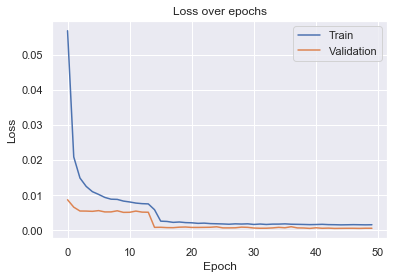

In [268]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss over epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()

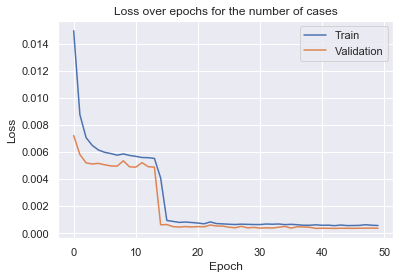

In [269]:
plt.plot(history.history['infectious_loss'])
plt.plot(history.history['val_infectious_loss'])
plt.title('Loss over epochs for the number of cases')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()

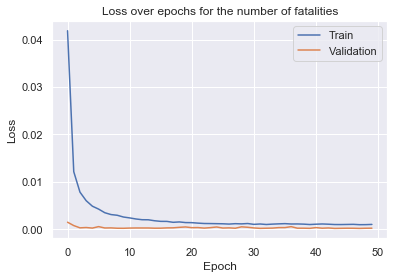

In [270]:
plt.plot(history.history['removed_loss'])
plt.plot(history.history['val_removed_loss'])
plt.title('Loss over epochs for the number of fatalities')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='best')
plt.show()

# 5. Generate predictions using the model

In [271]:
model.load_weights("best_model.h5")
predictions = model.predict([X_temporal_test])

In [274]:
display_limit = 30
for inputs, pred_cases, exp_cases, pred_fatalities, exp_fatalities in zip(X_temporal_test,predictions[0][:display_limit], Y_cases_test[:display_limit], predictions[1][:display_limit], Y_fatalities_test[:display_limit]):
    print("================================================")
    print(inputs)
    print("Expected infectious rate:", exp_cases)
    print("Prediction:", pred_cases)
    print("Expected removed rate:", exp_fatalities)
    print("Prediction:", pred_fatalities)

[[ 8.9445394e-01  7.1994081e-02  4.3461442e-02]
 [ 9.0608853e-01  7.8569077e-02  2.5784640e-02]
 [ 8.9907515e-01  9.5472544e-02  1.4588829e-02]
 [ 8.7941420e-01  1.1247595e-01  5.6674215e-03]
 [ 8.6328954e-01  1.2838064e-01  4.2406642e-03]
 [ 8.4579909e-01  1.4640944e-01  1.4397176e-02]
 [ 8.3152670e-01  1.6029018e-01 -3.8020426e-04]
 [ 8.1101876e-01  1.9411136e-01  1.8808348e-03]
 [ 7.8657079e-01  2.1350810e-01 -1.2994770e-02]
 [ 7.6007736e-01  2.4321496e-01  1.0853340e-02]
 [ 7.4157178e-01  2.5097674e-01  4.1518840e-03]
 [ 7.1357840e-01  2.8287685e-01  1.3488653e-03]
 [ 6.9578940e-01  3.1241158e-01 -5.8815372e-03]
 [ 6.6510659e-01  3.3752301e-01 -4.9068785e-04]
 [ 6.4203787e-01  3.4496942e-01 -7.3995604e-03]
 [ 6.1966127e-01  3.8476536e-01  2.6916787e-03]
 [ 5.8607554e-01  4.0102848e-01 -3.3081514e-03]
 [ 5.7023579e-01  4.2585474e-01  2.3568585e-03]
 [ 5.3715724e-01  4.5992869e-01 -2.2434692e-03]
 [ 5.1318693e-01  4.8367739e-01 -3.5240173e-03]]
Expected infectious rate: [0.50382614 0

# 6. Apply the model to predict future trends

In [276]:
#Will retrieve the number of cases and fatalities for the past 14
def build_inputs_for_date(code, date, gdf):
    start_date = date - timedelta(days=days_in_sequence-1)
    end_date = date - timedelta(days=1)
    
    str_start_date = start_date.strftime("%Y-%m-%d")
    str_end_date = end_date.strftime("%Y-%m-%d")
    tdf = gdf[(gdf["Code"] == code) & (gdf["Date"] >= str_start_date) & (gdf["Date"] <= str_end_date)]

    #preparing the temporal inputs
    temporal_input_data = np.transpose(np.reshape(np.asarray([tdf["infectious_rate"],
                                                 tdf["removed_rate"],
                                                 tdf["susceptible_rate"]]),
                                     (3,sequence_length)), (1,0) ).astype(np.float32)
    
    return [np.array([temporal_input_data])]

In [335]:
#Take a dataframe in input, will do the predictions and return the dataframe with extra rows
#containing the predictions
def predict_for_region(code, pdf, gdf):
    tdf = pdf[pdf["Code"]==code]
    # begin_prediction = "2020-03-26"
    begin_prediction = tdf.iloc[0]["Date"]
    start_date = datetime.strptime(begin_prediction,"%Y-%m-%d") + timedelta(days_in_sequence)
    print("prediction start date: {}".format(datetime.strftime(start_date, "%Y-%m-%d")))
    # end_prediction = "2020-04-15"
    end_prediction = tdf.iloc[-1]["Date"]
    end_date = datetime.strptime(end_prediction,"%Y-%m-%d")
    
    date_list = [start_date + timedelta(days=x) for x in range(0, (end_date-start_date).days+1, days_in_sequence)]
    for date in date_list:
        date_until = date + timedelta(days=output_days-1)
        input_data = build_inputs_for_date(code, date, gdf)
        result = model.predict(input_data)

        # add predicted results
        # pdf.loc[(pdf["Code"] == code) & (pdf["Date"] == date.strftime("%Y-%m-%d")), ["infectious_rate", "removed_rate"]] = [result[0][0][0], result[1][0][0]]
        pdf.loc[(pdf["Code"] == code) & (pdf["Date"] >= date.strftime("%Y-%m-%d")) & (pdf["Date"] <= date_until.strftime("%Y-%m-%d")), ["infectious_rate"]] = result[0][0].tolist()
        pdf.loc[(pdf["Code"] == code) & (pdf["Date"] >= date.strftime("%Y-%m-%d")) & (pdf["Date"] <= date_until.strftime("%Y-%m-%d")), ["removed_rate"]] = result[1][0].tolist()
        
    return pdf

In [337]:
#The functions that are called here need to optimise, sorry about that!
# test_country = ["DEU", "FRA"]
# test_country = ["KOR", "ITA", "FRA", "DEU", "ISL", "DNK", "THA", "TWN"]
# pdf = new_df.copy().query("Code in {}".format(test_country)) # prediction data frame

pdf = SIR_df.copy()
pdf["infectious_rate"] = np.nan
pdf["removed_rate"] = np.nan

gdf = SIR_df.copy()

with tqdm(total=len(list(pdf.Code.unique()))) as pbar:
#     for code in test_country: #copy_df.Code.unique()
#         pdf = predict_for_region(code, pdf)
    for code in range(181, 200):
        pdf = predict_for_region("SIR-{}".format(code), pdf, gdf)
        pbar.update(1)
pdf.to_csv("./predictions.csv")

  0%|          | 0/200 [00:00<?, ?it/s]

prediction start date: 2020-02-22


  0%|          | 1/200 [00:00<01:27,  2.27it/s]

prediction start date: 2020-02-22


  1%|          | 2/200 [00:00<01:17,  2.56it/s]

prediction start date: 2020-02-22


  2%|▏         | 3/200 [00:01<01:15,  2.61it/s]

prediction start date: 2020-02-22


  2%|▏         | 4/200 [00:01<01:14,  2.65it/s]

prediction start date: 2020-02-22


  2%|▎         | 5/200 [00:01<01:09,  2.80it/s]

prediction start date: 2020-02-22


  3%|▎         | 6/200 [00:02<01:06,  2.92it/s]

prediction start date: 2020-02-22


  4%|▎         | 7/200 [00:02<01:01,  3.13it/s]

prediction start date: 2020-02-22


  4%|▍         | 8/200 [00:02<00:58,  3.27it/s]

prediction start date: 2020-02-22


  4%|▍         | 9/200 [00:03<01:09,  2.73it/s]

prediction start date: 2020-02-22


  5%|▌         | 10/200 [00:03<01:09,  2.73it/s]

prediction start date: 2020-02-22


  6%|▌         | 11/200 [00:03<01:04,  2.91it/s]

prediction start date: 2020-02-22


  6%|▌         | 12/200 [00:04<01:10,  2.67it/s]

prediction start date: 2020-02-22


  6%|▋         | 13/200 [00:04<01:08,  2.73it/s]

prediction start date: 2020-02-22


  7%|▋         | 14/200 [00:05<01:17,  2.39it/s]

prediction start date: 2020-02-22


  8%|▊         | 15/200 [00:05<01:14,  2.47it/s]

prediction start date: 2020-02-22


  8%|▊         | 16/200 [00:05<01:13,  2.52it/s]

prediction start date: 2020-02-22


  8%|▊         | 17/200 [00:06<01:16,  2.38it/s]

prediction start date: 2020-02-22


  9%|▉         | 18/200 [00:06<01:11,  2.56it/s]

prediction start date: 2020-02-22


 10%|▉         | 19/200 [00:07<01:11,  2.53it/s]


# 7. Outputs: Observing the curves

In [338]:
dates = gdf.Date.unique()
dates = sorted(dates)
last_date = dates[-1]
print(last_date)

2020-07-09


In [339]:
def display_comparison(code,groundtruth_df):
    groundtruth = groundtruth_df[(groundtruth_df["Code"]==code) & (groundtruth_df["Date"]>="2020-02-07")]
    prediction = pdf[(pdf["Code"] == code) & (pdf["Date"] >= "2020-02-07")]
    
    plt.plot(groundtruth.infectious_rate.values)
    plt.plot(prediction.infectious_rate.values)
    plt.title("Comparison between the actual data and our predictions for the number of cases")
    plt.ylabel('Number of cases')
    plt.xlabel('Date')
    plt.xticks(range(len(prediction.Date.values)),prediction.Date.values,rotation='vertical')
    plt.legend(['Groundtruth', 'Prediction'], loc='best')
    plt.show()
    
    plt.plot(groundtruth.removed_rate.values)
    plt.plot(prediction.removed_rate.values)
    plt.title("Comparison between the actual data and our predictions for the number of fatalities")
    plt.ylabel('Number of fatalities')
    plt.xlabel('Date')
    plt.xticks(range(len(prediction.Date.values)),prediction.Date.values,rotation='vertical')
    plt.legend(['Groundtruth', 'Prediction'], loc='best')
    plt.show()

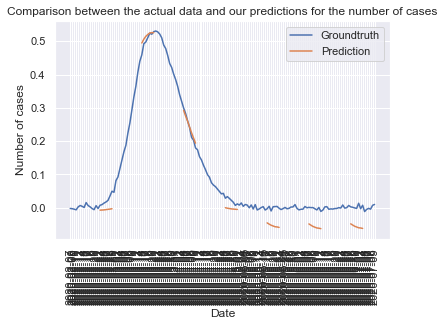

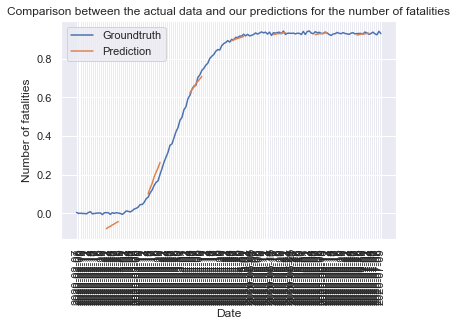

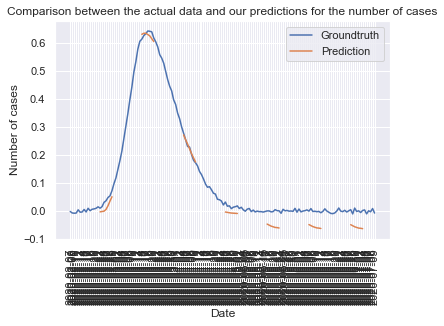

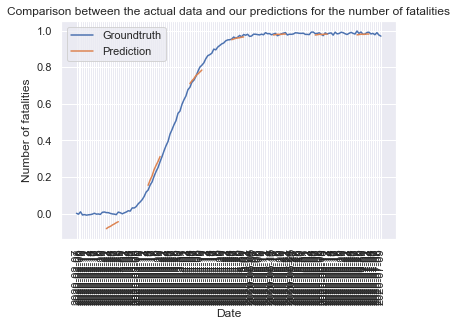

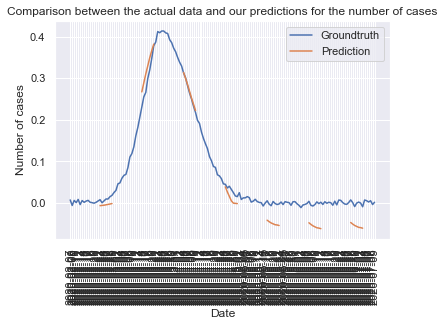

...

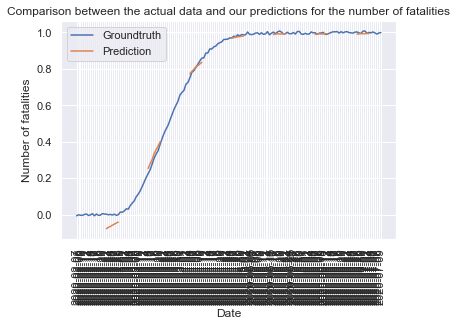

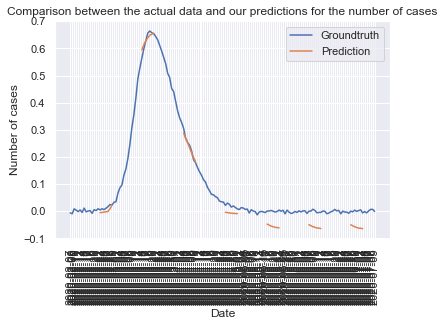

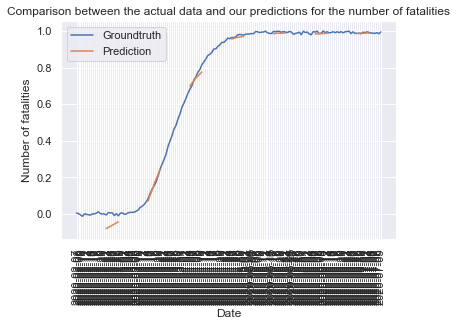

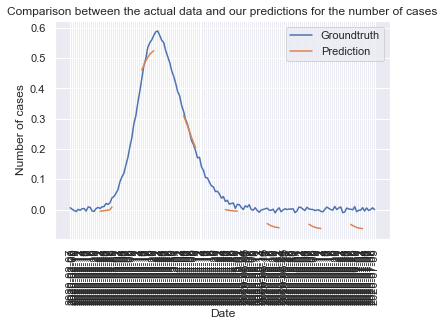

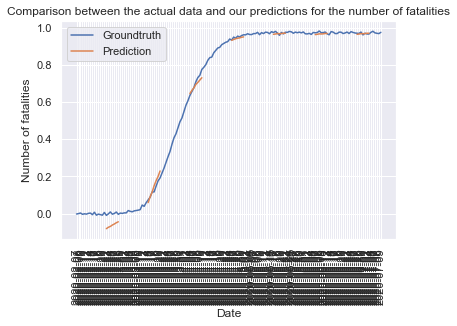

In [344]:
for code in range(181, 200):
    print("------------------------------SIR-{}---------------------------------".format(code))
    display_comparison("SIR-{}".format(code), gdf)

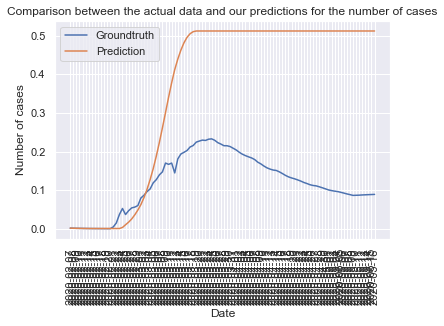

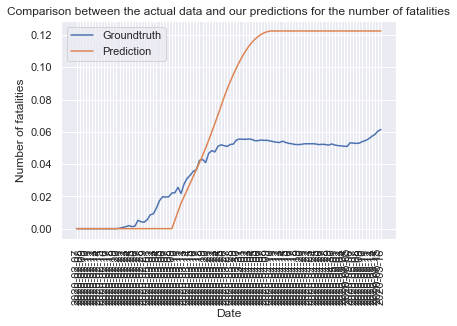

In [222]:
display_comparison("ITA", gdf)